# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GroupShuffleSplit
from sklearn.cluster import KMeans
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from utils import visualize, LinearRegressionModel, RandomForestRegressionModel, RandomForestClassifierModel, plot_actual_vs_predicted
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

# Read data and fill missing values

In [2]:
# Read
df = pd.read_excel('data.xlsx')

# Pre-processing
df['ID'] = df['ID'].ffill()
df['Output Measured Value'] = df['Output Measured Value'].ffill()
df['D1 G2 F2'] = abs(df['D1 G2 F2']) # There is only one negative value that doesn't make sense sense

#df['Strength'] = pd.qcut(df['Output Measured Value'], q=4, labels=["Low", "Medium", "Medium2", "High"])

'''df.insert(
    2,
    'Strength',
    np.select(
        [df['Output Measured Value'] <= 9, df['Output Measured Value'] > 9],
        ['Low', 'High'],
        default='High'
    )
)'''

df.insert(
    2,
    'Strength',
    np.select(
        [df['Output Measured Value'] <= 6, df['Output Measured Value'] <= 12.5],
        ['Low', 'Moderate'],
        default='High'
    )
)

display(df.head(5))
display(df.isna().sum())
display(df.describe())

,ID,Output Measured Value,Strength,Position,D1 G1 F1,D1 G1 F2,D1 G1 F3,D1 G1 F4,D1 G1 F5,D1 G2 F1,...,D2 G1 F1,D2 G1 F2,D2 G1 F3,D2 G1 F4,D2 G1 F5,D2 G2 F1,D2 G2 F2,D2 G2 F3,D2 G2 F4,D2 G2 F5
0,1.0,8.3,Moderate,1,24.855010,84.139247,23.830600,23.571756,1.531475,22.433993,...,34.111997,44.976222,24.1065,24.0865,1.5315,33.371920,51.039573,20.9434,25.8995,2.0676
1,1.0,8.3,Moderate,2,27.156592,52.184199,26.840996,25.930472,3.568710,23.185990,...,38.621590,47.462078,25.9995,28.3358,3.5687,36.270092,52.097181,22.2476,28.5754,2.0026
2,1.0,8.3,Moderate,3,29.578644,45.105642,29.195542,24.911200,5.404616,21.138152,...,39.072166,49.267320,25.2507,29.3228,5.4046,35.128657,52.764088,21.2008,27.8947,2.5366
3,1.0,8.3,Moderate,4,26.072645,48.682841,24.992980,21.454382,4.923152,18.587671,...,33.259734,50.685175,20.8406,25.4488,4.9232,30.432683,44.888107,21.2663,21.1834,5.0156
4,1.0,8.3,Moderate,5,16.149233,66.647127,19.929927,20.117635,5.131219,19.050015,...,28.419664,44.361820,19.9844,19.5441,5.1312,30.755473,35.011319,25.1000,17.5826,2.5964


ID                       0
Output Measured Value    0
Strength                 0
Position                 0
D1 G1 F1                 0
D1 G1 F2                 0
D1 G1 F3                 0
D1 G1 F4                 0
D1 G1 F5                 0
D1 G2 F1                 0
D1 G2 F2                 0
D1 G2 F3                 0
D1 G2 F4                 0
D1 G2 F5                 0
D2 G1 F1                 0
D2 G1 F2                 0
D2 G1 F3                 0
D2 G1 F4                 0
D2 G1 F5                 0
D2 G2 F1                 0
D2 G2 F2                 0
D2 G2 F3                 0
D2 G2 F4                 0
D2 G2 F5                 0
dtype: int64

,ID,Output Measured Value,Position,D1 G1 F1,D1 G1 F2,D1 G1 F3,D1 G1 F4,D1 G1 F5,D1 G2 F1,D1 G2 F2,...,D2 G1 F1,D2 G1 F2,D2 G1 F3,D2 G1 F4,D2 G1 F5,D2 G2 F1,D2 G2 F2,D2 G2 F3,D2 G2 F4,D2 G2 F5
count,252.000000,252.0000,252.00000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,...,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000
mean,18.500000,8.2500,4.00000,18.069905,87.588061,18.099414,19.372326,2.000494,18.522951,88.329287,...,26.900179,43.050596,19.527419,18.301004,2.000469,27.820993,43.934150,19.840258,19.192408,2.606554
std,10.408968,4.3949,2.00398,3.436150,16.044096,3.183842,3.006238,0.970791,4.108722,16.582938,...,4.200390,3.455197,3.049620,3.284055,0.970776,5.035520,3.382378,3.581605,3.907575,1.584127
min,1.000000,2.0000,1.00000,6.714715,30.332224,8.086380,9.530389,0.784746,2.238465,26.837626,...,13.283746,30.488692,9.646500,8.182400,0.784700,12.060246,34.048846,8.511200,7.833900,0.393500
25%,9.750000,4.8375,2.00000,16.166722,81.160370,16.249377,17.714432,1.366699,16.131939,78.753397,...,24.541056,40.666580,17.740700,16.253775,1.366700,24.781573,41.641470,17.797825,16.831025,1.715400
50%,18.500000,7.8400,4.00000,18.210960,88.853673,18.300943,19.488135,1.748508,18.432529,87.687524,...,26.907570,43.127498,19.505450,18.374800,1.748500,27.724978,44.085105,19.761900,18.978000,2.298050
75%,27.250000,10.9275,6.00000,20.131361,95.465410,19.927087,21.071310,2.284017,20.641120,95.946255,...,29.555929,44.998413,21.238250,20.317850,2.284025,30.732032,46.058790,21.958650,21.127875,3.079825
max,36.000000,18.0600,7.00000,29.578644,147.621765,29.195542,26.748940,6.591557,29.111563,149.987647,...,39.072166,52.058013,27.974300,29.322800,6.591600,41.272979,54.906326,28.666800,30.263200,13.887300


In [18]:
sorted(df['Output Measured Value'].unique())

[2.0,
 2.52,
 2.57,
 2.72,
 3.09,
 3.15,
 3.78,
 4.38,
 4.74,
 4.87,
 4.89,
 5.12,
 5.28,
 6.27,
 6.33,
 6.57,
 6.78,
 7.38,
 8.3,
 8.68,
 8.72,
 8.8,
 9.05,
 9.94,
 10.51,
 10.65,
 10.83,
 11.22,
 12.11,
 12.97,
 13.17,
 13.24,
 14.26,
 16.85,
 17.2,
 18.06]

# Visualize data

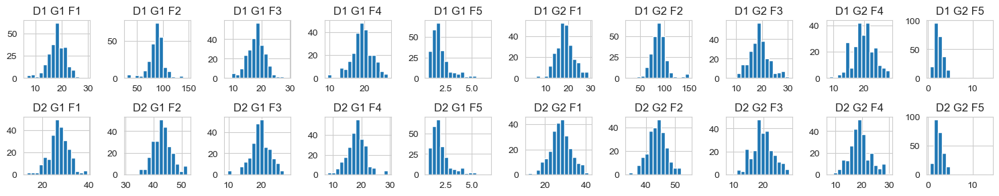

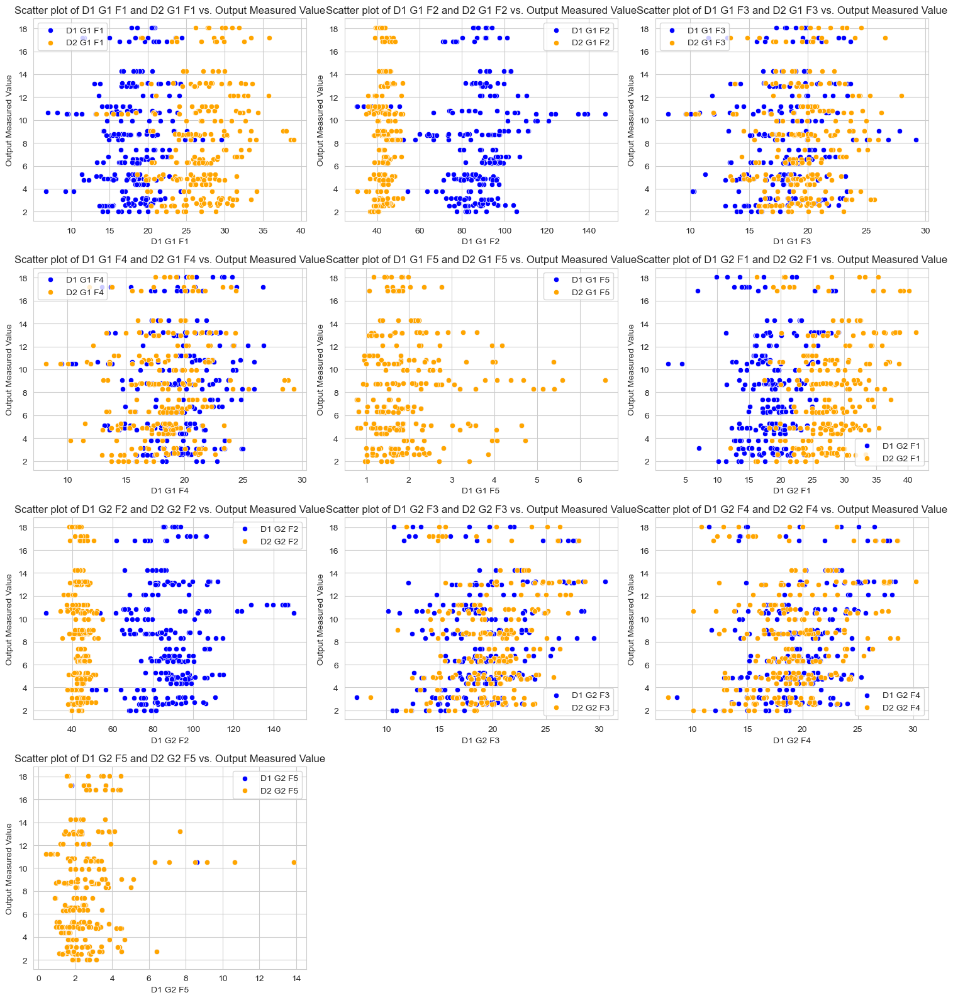

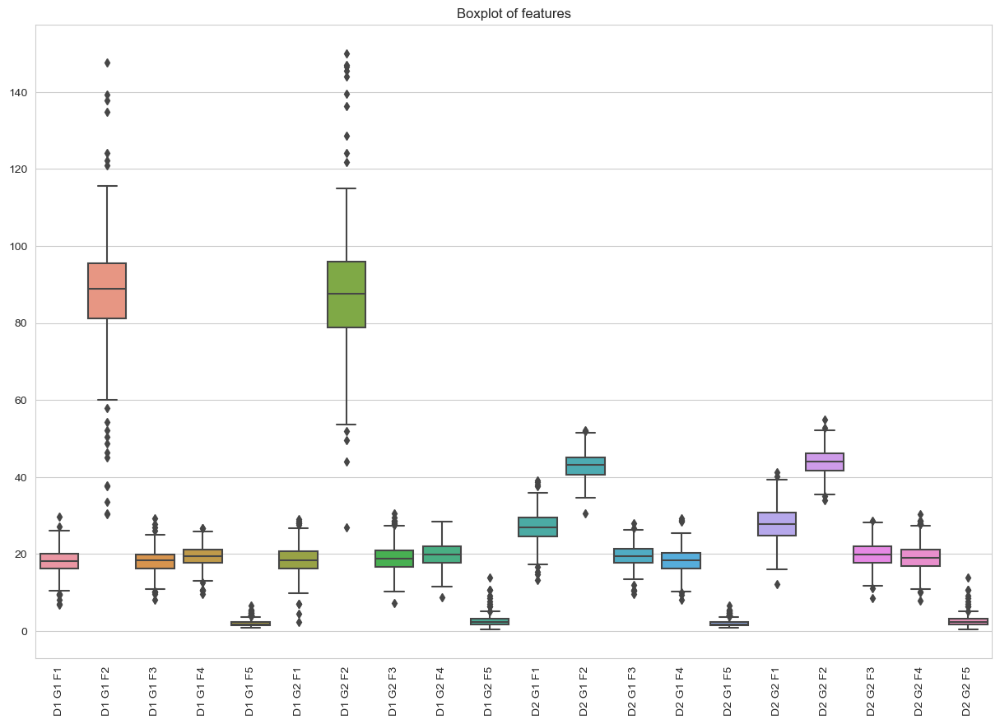

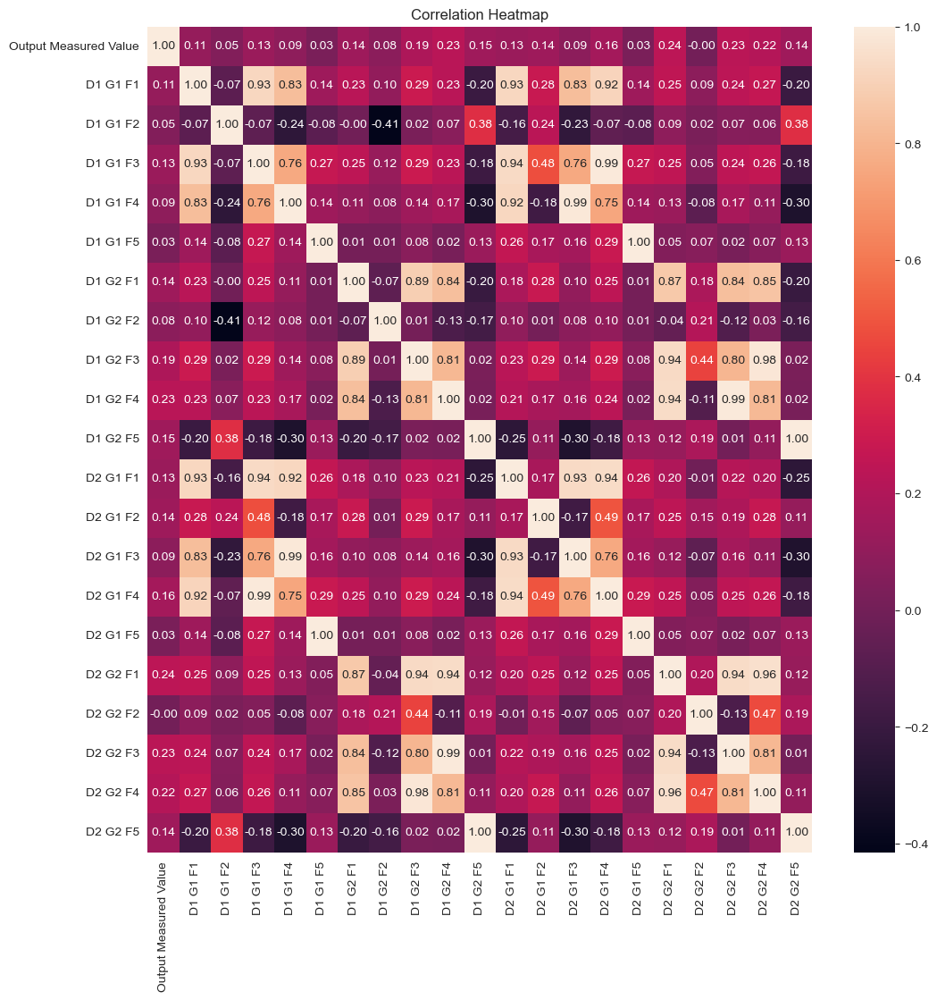

In [19]:
#visualize(df)

# Normalize, split and flatten

In [3]:
# Assuming feature_columns contains the names of the columns to be scaled
feature_columns = [col for col in df.columns if col.startswith('D')]

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler to your data and transform the data
df[feature_columns] = scaler.fit_transform(df[feature_columns])
df1 = df.drop([col for col in df.columns if col.startswith('D2')], axis=1)
df2 = df.drop([col for col in df.columns if col.startswith('D1')], axis=1)

# Create a list to hold each flattened row
flattened_rows = []

# Iterate through each building
for id, group in df.groupby('ID'):
    # Initialize a dictionary for the flattened row
    flattened_row = {'ID': id, 'Output Measured Value': group['Output Measured Value'].iloc[0], 'Strength': group['Strength'].iloc[0]}

    # Iterate through each column (excluding 'ID' and 'Output Measured Value')
    for col in [c for c in df.columns if c not in ['ID', 'Output Measured Value', 'Strength', 'Position']]:
        # Add each position's data to the flattened row
        for position in range(1, 8):  # Assuming there are always 7 positions
            flattened_row[f'{col} P{position}'] = group[group['Position'] == position][col].values[0]
    
    # Add the dictionary to the list of rows
    flattened_rows.append(flattened_row)

# Concatenate the list of rows to create the new DataFrame
flattened_df = pd.concat([pd.DataFrame([row]) for row in flattened_rows], ignore_index=True)

flattened_df1 = flattened_df.drop([col for col in flattened_df.columns if col.startswith('D2')], axis=1)
flattened_df2 = flattened_df.drop([col for col in flattened_df.columns if col.startswith('D1')], axis=1)

display(df1.head(5))
display(df2.head(5))
display(flattened_df1.head(5))
display(flattened_df2.head(5))
#visualize(df)

,ID,Output Measured Value,Strength,Position,D1 G1 F1,D1 G1 F2,D1 G1 F3,D1 G1 F4,D1 G1 F5,D1 G2 F1,D1 G2 F2,D1 G2 F3,D1 G2 F4,D1 G2 F5
0,1.0,8.3,Moderate,1,0.793402,0.458754,0.745848,0.815479,0.128595,0.751515,0.552227,0.813449,0.624779,0.124061
1,1.0,8.3,Moderate,2,0.894067,0.186308,0.888459,0.952466,0.479431,0.779498,0.650727,0.954253,0.706926,0.119244
2,1.0,8.3,Moderate,3,1.000000,0.125957,1.000000,0.893270,0.795595,0.703294,0.684120,0.885336,0.622157,0.158815
3,1.0,8.3,Moderate,4,0.846658,0.156456,0.800913,0.692508,0.712682,0.608386,0.713376,0.591816,0.644515,0.342534
4,1.0,8.3,Moderate,5,0.412638,0.309618,0.561062,0.614874,0.748513,0.625590,0.542055,0.421188,0.799299,0.163248


,ID,Output Measured Value,Strength,Position,D2 G1 F1,D2 G1 F2,D2 G1 F3,D2 G1 F4,D2 G1 F5,D2 G2 F1,D2 G2 F2,D2 G2 F3,D2 G2 F4,D2 G2 F5
0,1.0,8.3,Moderate,1,0.807659,0.671673,0.788965,0.752308,0.128606,0.729534,0.814611,0.616811,0.805446,0.124064
1,1.0,8.3,Moderate,2,0.982528,0.786923,0.892251,0.953312,0.479430,0.828743,0.865317,0.681518,0.924750,0.119247
2,1.0,8.3,Moderate,3,1.000000,0.870617,0.851395,1.000000,0.795588,0.789670,0.897292,0.629582,0.894402,0.158821
3,1.0,8.3,Moderate,4,0.774611,0.936352,0.610772,0.816749,0.712687,0.628919,0.519682,0.632832,0.595181,0.342535
4,1.0,8.3,Moderate,5,0.586927,0.643188,0.564056,0.537440,0.748506,0.639968,0.046145,0.823037,0.434641,0.163253


,ID,Output Measured Value,Strength,D1 G1 F1 P1,D1 G1 F1 P2,D1 G1 F1 P3,D1 G1 F1 P4,D1 G1 F1 P5,D1 G1 F1 P6,D1 G1 F1 P7,...,D1 G2 F4 P5,D1 G2 F4 P6,D1 G2 F4 P7,D1 G2 F5 P1,D1 G2 F5 P2,D1 G2 F5 P3,D1 G2 F5 P4,D1 G2 F5 P5,D1 G2 F5 P6,D1 G2 F5 P7
0,1.0,8.30,Moderate,0.793402,0.894067,1.000000,0.846658,0.412638,0.357420,0.433507,...,0.799299,0.525732,0.289139,0.124061,0.119244,0.158815,0.342534,0.163248,0.250184,0.240547
1,2.0,8.68,Moderate,0.413516,0.400822,0.370479,0.343052,0.379813,0.621895,0.605085,...,0.475169,0.331708,0.419448,0.203585,0.211393,0.185442,0.193560,0.247584,0.186132,0.084248
2,3.0,10.83,Moderate,0.490710,0.533898,0.462451,0.403085,0.508842,0.607635,0.704176,...,0.777503,0.676549,0.565071,0.113238,0.089909,0.169577,0.168128,0.103898,0.191843,0.164141
3,4.0,14.26,High,0.605390,0.548463,0.535641,0.511731,0.432102,0.442521,0.497285,...,0.755138,0.753249,0.591208,0.098212,0.136095,0.141034,0.118873,0.141431,0.238712,0.149820
4,5.0,13.17,High,0.277146,0.310052,0.475830,0.643505,0.764163,0.768902,0.653663,...,0.685484,0.578266,0.315869,0.131804,0.110324,0.135918,0.142337,0.224774,0.256621,0.144457


,ID,Output Measured Value,Strength,D2 G1 F1 P1,D2 G1 F1 P2,D2 G1 F1 P3,D2 G1 F1 P4,D2 G1 F1 P5,D2 G1 F1 P6,D2 G1 F1 P7,...,D2 G2 F4 P5,D2 G2 F4 P6,D2 G2 F4 P7,D2 G2 F5 P1,D2 G2 F5 P2,D2 G2 F5 P3,D2 G2 F5 P4,D2 G2 F5 P5,D2 G2 F5 P6,D2 G2 F5 P7
0,1.0,8.30,Moderate,0.807659,0.982528,1.000000,0.774611,0.586927,0.475404,0.416200,...,0.434641,0.360800,0.304151,0.124064,0.119247,0.158821,0.342535,0.163253,0.250189,0.240548
1,2.0,8.68,Moderate,0.522166,0.478287,0.482291,0.433056,0.455115,0.660001,0.644723,...,0.386321,0.206596,0.316880,0.203590,0.211393,0.185448,0.193563,0.247588,0.186137,0.084254
2,3.0,10.83,Moderate,0.515708,0.565178,0.565088,0.522216,0.597935,0.704657,0.769538,...,0.512642,0.492650,0.465052,0.113245,0.089908,0.169582,0.168129,0.103900,0.191844,0.164142
3,4.0,14.26,High,0.648726,0.617719,0.588273,0.542016,0.453624,0.453869,0.439400,...,0.653538,0.643819,0.498451,0.098215,0.136100,0.141035,0.118877,0.141435,0.238717,0.149824
4,5.0,13.17,High,0.230237,0.276319,0.477986,0.633026,0.788027,0.753363,0.669754,...,0.747188,0.458093,0.206395,0.131809,0.110325,0.135922,0.142339,0.224777,0.256622,0.141887


# Aggregate (mean, std)

,ID,Output Measured Value,Strength,D1 G1 F1 mean,D1 G1 F1 std,D1 G1 F2 mean,D1 G1 F2 std,D1 G1 F3 mean,D1 G1 F3 std,D1 G1 F4 mean,...,D2 G2 F1 mean,D2 G2 F1 std,D2 G2 F2 mean,D2 G2 F2 std,D2 G2 F3 mean,D2 G2 F3 std,D2 G2 F4 mean,D2 G2 F4 std,D2 G2 F5 mean,D2 G2 F5 std
0,1.0,8.30,Moderate,0.676813,0.266173,0.262879,0.121462,0.698624,0.218174,0.663355,...,0.624301,0.187747,0.563769,0.318806,0.601440,0.157039,0.617053,0.259621,0.199808,0.081458
1,2.0,8.68,Moderate,0.447809,0.115472,0.329562,0.050657,0.421745,0.092885,0.608633,...,0.479565,0.123313,0.474522,0.152784,0.496066,0.088326,0.456265,0.152666,0.187425,0.050238
2,3.0,10.83,Moderate,0.530114,0.099198,0.445083,0.066019,0.492552,0.118723,0.722825,...,0.573595,0.047833,0.290091,0.085585,0.667996,0.076014,0.474224,0.028670,0.142964,0.039589
3,4.0,14.26,High,0.510447,0.060582,0.557643,0.051101,0.491850,0.070436,0.565496,...,0.652103,0.058189,0.435201,0.075407,0.699479,0.045013,0.596653,0.073939,0.146315,0.044296
4,5.0,13.17,High,0.556180,0.204341,0.518376,0.038886,0.538237,0.200478,0.531864,...,0.698473,0.223503,0.545556,0.184257,0.689944,0.178180,0.687253,0.260139,0.163383,0.054671


,ID,Output Measured Value,Strength,D1 G1 F1 mean,D1 G1 F1 std,D1 G1 F2 mean,D1 G1 F2 std,D1 G1 F3 mean,D1 G1 F3 std,D1 G1 F4 mean,...,D1 G2 F1 mean,D1 G2 F1 std,D1 G2 F2 mean,D1 G2 F2 std,D1 G2 F3 mean,D1 G2 F3 std,D1 G2 F4 mean,D1 G2 F4 std,D1 G2 F5 mean,D1 G2 F5 std
0,1.0,8.30,Moderate,0.676813,0.266173,0.262879,0.121462,0.698624,0.218174,0.663355,...,0.629652,0.126591,0.586044,0.096663,0.614560,0.272570,0.601792,0.161435,0.199805,0.081459
1,2.0,8.68,Moderate,0.447809,0.115472,0.329562,0.050657,0.421745,0.092885,0.608633,...,0.555281,0.124969,0.370127,0.038219,0.444619,0.140945,0.490501,0.098235,0.187420,0.050239
2,3.0,10.83,Moderate,0.530114,0.099198,0.445083,0.066019,0.492552,0.118723,0.722825,...,0.565475,0.020795,0.350983,0.041656,0.470810,0.029994,0.690558,0.086195,0.142962,0.039589
3,4.0,14.26,High,0.510447,0.060582,0.557643,0.051101,0.491850,0.070436,0.565496,...,0.718511,0.083834,0.432091,0.057548,0.593687,0.077361,0.707312,0.057441,0.146311,0.044296
4,5.0,13.17,High,0.556180,0.204341,0.518376,0.038886,0.538237,0.200478,0.531864,...,0.755948,0.225824,0.476356,0.039143,0.678699,0.249054,0.692349,0.191711,0.163748,0.054512


,ID,Output Measured Value,Strength,D2 G1 F1 mean,D2 G1 F1 std,D2 G1 F2 mean,D2 G1 F2 std,D2 G1 F3 mean,D2 G1 F3 std,D2 G1 F4 mean,...,D2 G2 F1 mean,D2 G2 F1 std,D2 G2 F2 mean,D2 G2 F2 std,D2 G2 F3 mean,D2 G2 F3 std,D2 G2 F4 mean,D2 G2 F4 std,D2 G2 F5 mean,D2 G2 F5 std
0,1.0,8.30,Moderate,0.720476,0.233743,0.794016,0.110249,0.634872,0.219857,0.717536,...,0.624301,0.187747,0.563769,0.318806,0.601440,0.157039,0.617053,0.259621,0.199808,0.081458
1,2.0,8.68,Moderate,0.525091,0.091206,0.467506,0.097956,0.578250,0.075116,0.436405,...,0.479565,0.123313,0.474522,0.152784,0.496066,0.088326,0.456265,0.152666,0.187425,0.050238
2,3.0,10.83,Moderate,0.605760,0.095791,0.461140,0.120858,0.667675,0.074421,0.499380,...,0.573595,0.047833,0.290091,0.085585,0.667996,0.076014,0.474224,0.028670,0.142964,0.039589
3,4.0,14.26,High,0.534804,0.086609,0.620355,0.094810,0.535634,0.098065,0.497716,...,0.652103,0.058189,0.435201,0.075407,0.699479,0.045013,0.596653,0.073939,0.146315,0.044296
4,5.0,13.17,High,0.546959,0.224172,0.737584,0.061339,0.500921,0.216278,0.549481,...,0.698473,0.223503,0.545556,0.184257,0.689944,0.178180,0.687253,0.260139,0.163383,0.054671


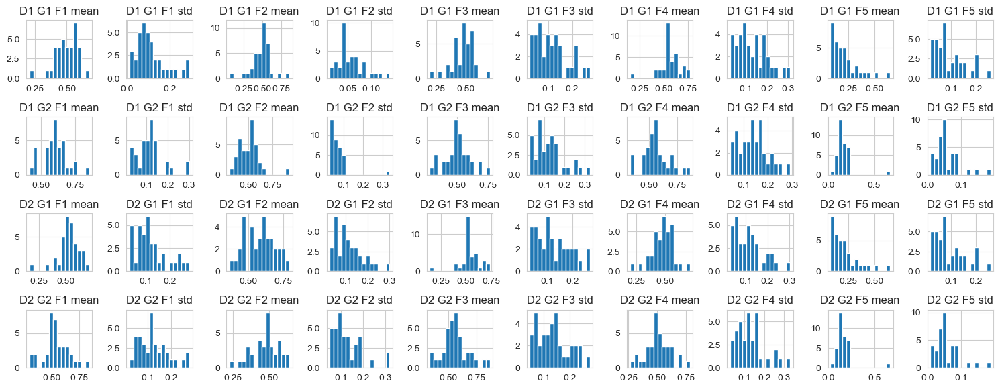

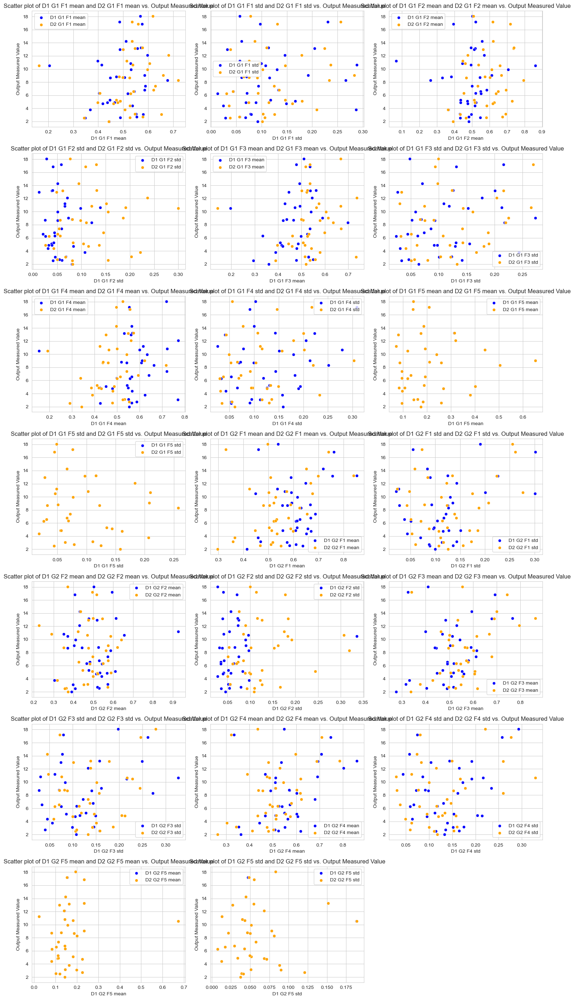

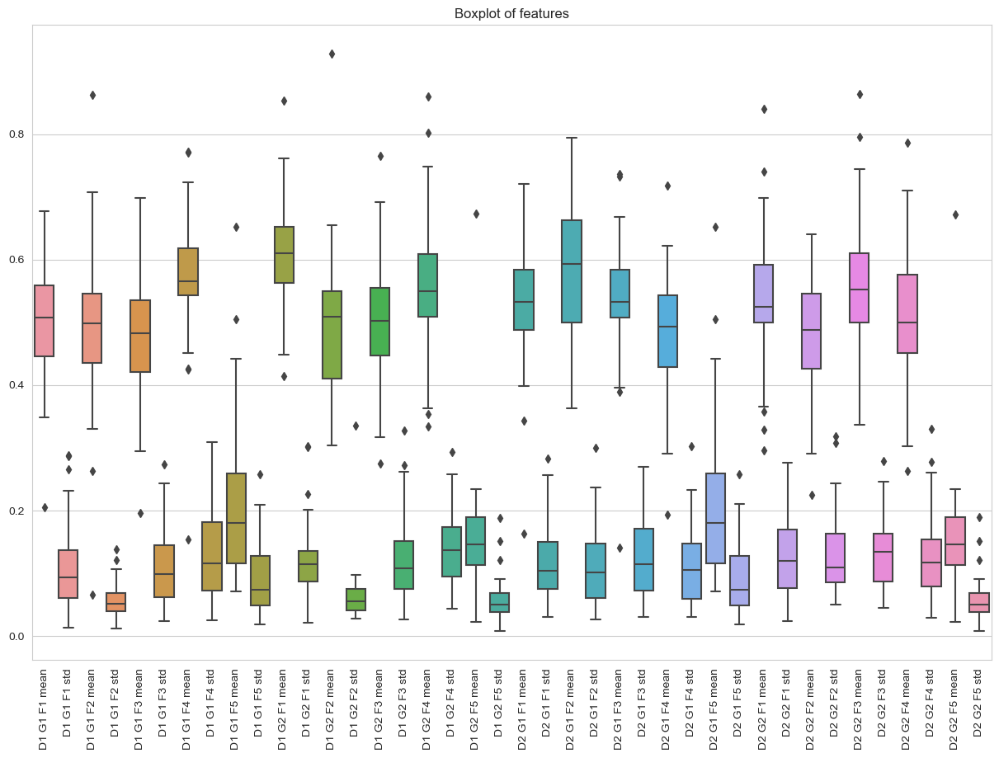

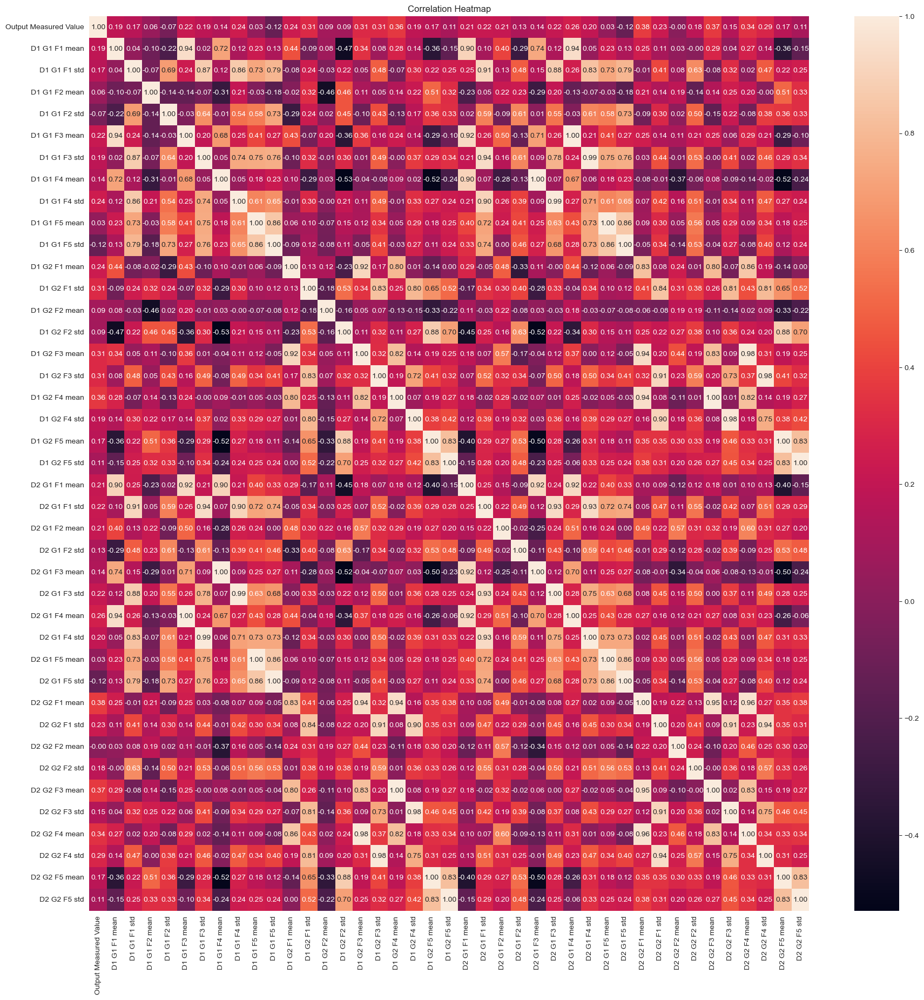

In [4]:
# Group by 'ID' and calculate mean and standard deviation for each building
feature_columns_df = [col for col in df.columns if col.startswith('D')]
feature_columns_df1 = [col for col in df1.columns if col.startswith('D')]
feature_columns_df2 = [col for col in df2.columns if col.startswith('D')]
stats_df = df.groupby(['ID', 'Output Measured Value', 'Strength'])[feature_columns_df].agg(['mean', 'std']).reset_index()
stats_df1 = df1.groupby(['ID', 'Output Measured Value', 'Strength'])[feature_columns_df1].agg(['mean', 'std']).reset_index()
stats_df2 = df2.groupby(['ID', 'Output Measured Value', 'Strength'])[feature_columns_df2].agg(['mean', 'std']).reset_index()
stats_df.columns = [' '.join(col).strip() for col in stats_df.columns.values]
stats_df1.columns = [' '.join(col).strip() for col in stats_df1.columns.values]
stats_df2.columns = [' '.join(col).strip() for col in stats_df2.columns.values]
display(stats_df.head(5))
display(stats_df1.head(5))
display(stats_df2.head(5))
#visualize(stats_df, True)

# Find feature diff with last position and cummulative sum to understand position impact

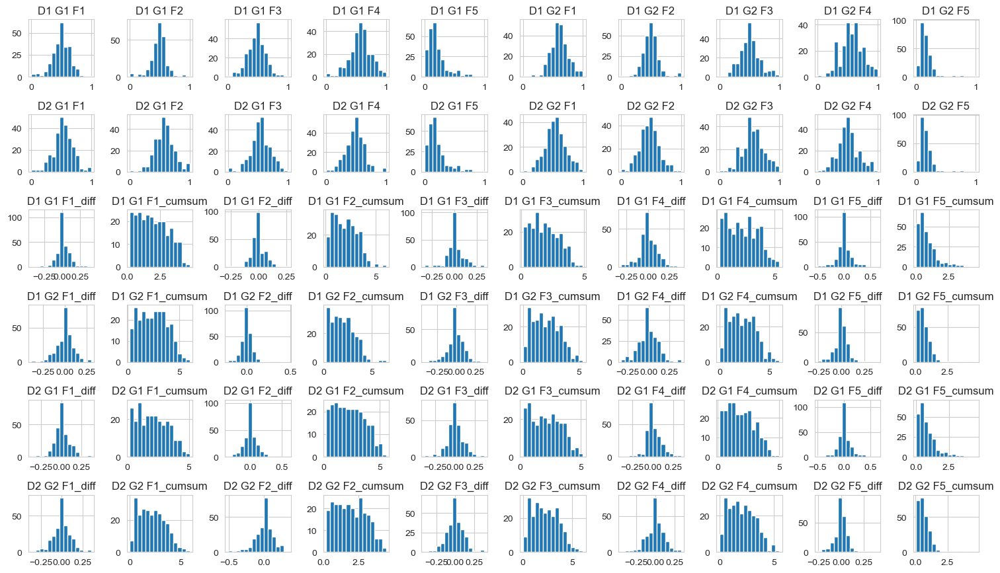

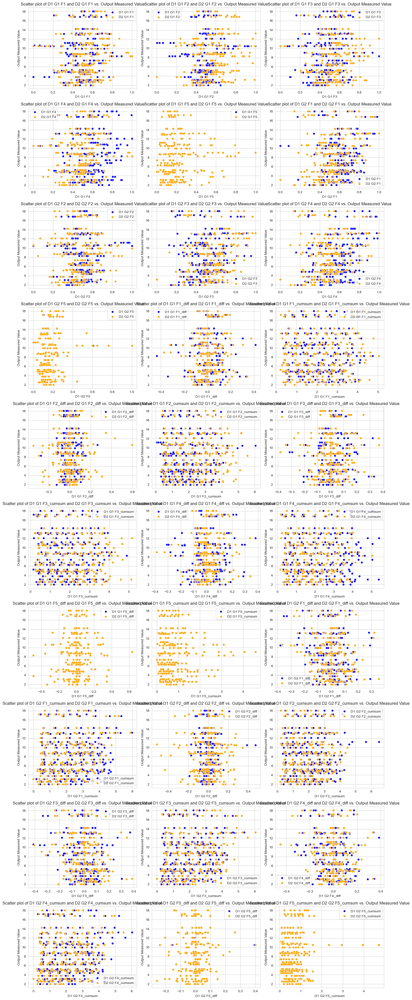

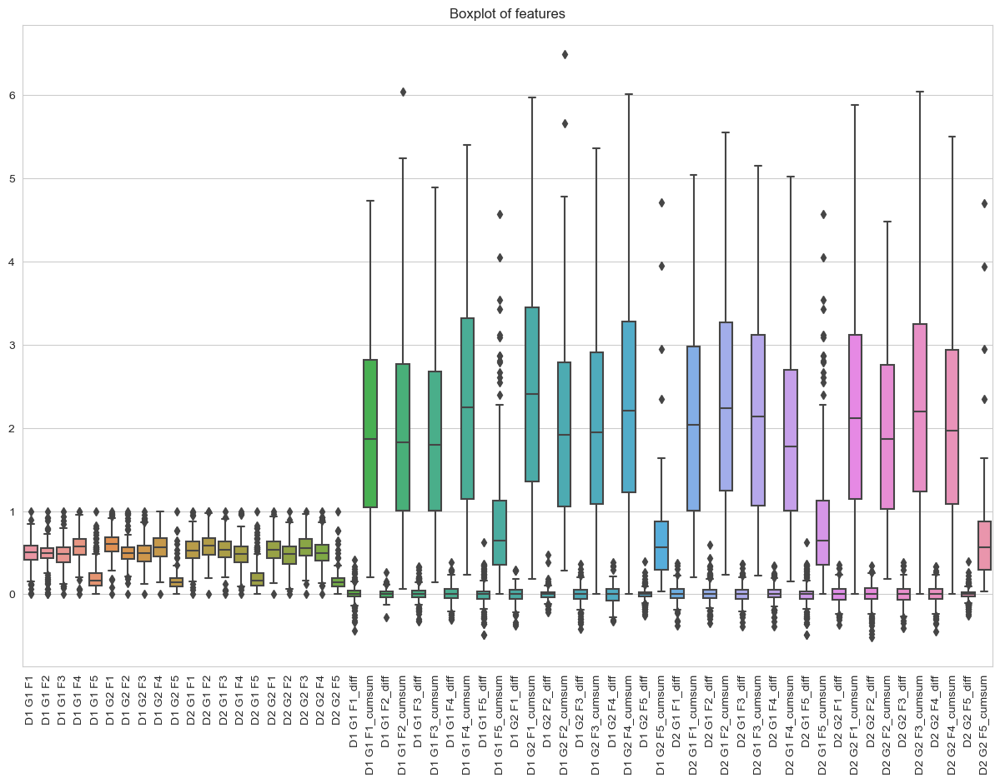

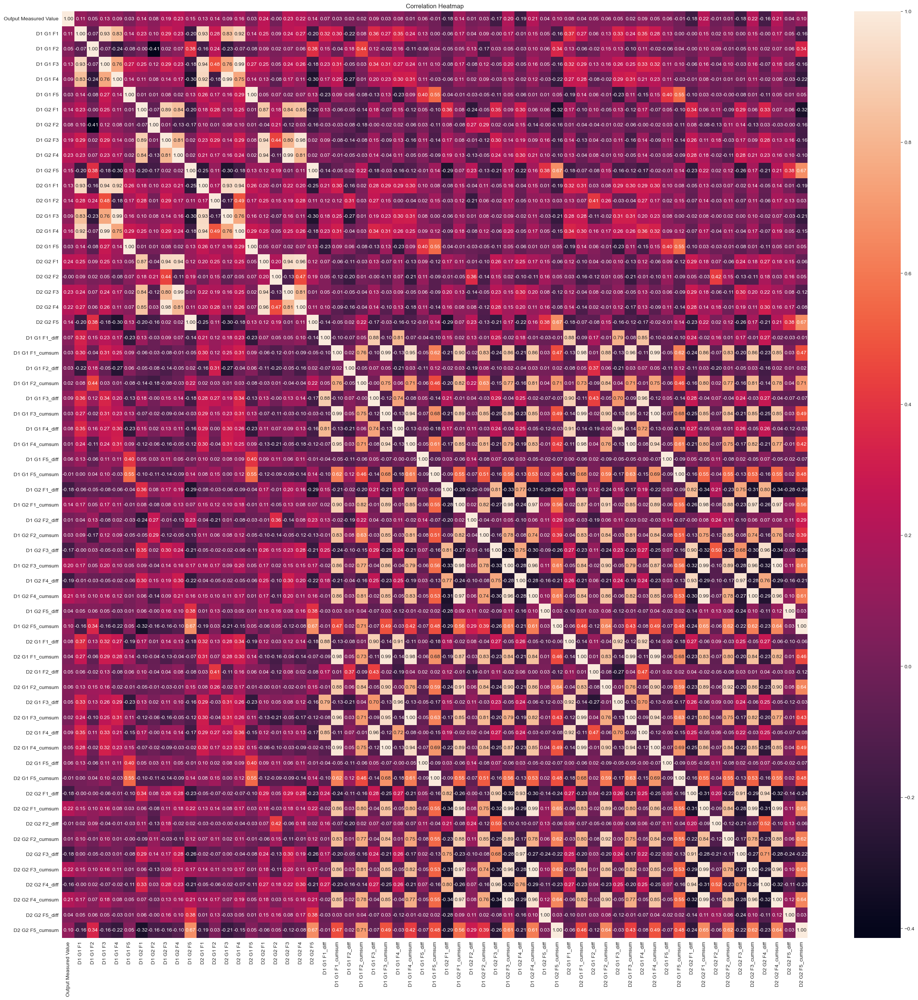

In [5]:
df_with_diffs = df.copy()
for feature in df.columns:
    if feature.startswith('D'):
        df_with_diffs[f'{feature}_diff'] = df.groupby('ID')[feature].diff().fillna(0)
        df_with_diffs[f'{feature}_cumsum'] = df.groupby('ID')[feature].cumsum()
visualize(df_with_diffs)

# Try Linear regression and Random Forest for flattened data and for aggregated data

In [6]:
LinearRegressionModel(stats_df1)
RandomForestRegressionModel(stats_df1)
RandomForestClassifierModel(stats_df1)
LinearRegressionModel(stats_df2)
RandomForestRegressionModel(stats_df1)
RandomForestClassifierModel(stats_df1)
LinearRegressionModel(flattened_df1)
RandomForestRegressionModel(flattened_df1)
RandomForestClassifierModel(flattened_df1)
LinearRegressionModel(flattened_df2)
RandomForestRegressionModel(flattened_df2)
RandomForestClassifierModel(flattened_df2)

Baseline Model RMSE: 12.55435573093006
    Actual  Predicted
0    13.24  -1.772990
1     4.87  -4.178349
2     3.09  12.234136
3    10.65 -13.806899
4     8.72  11.733319
5    11.22  10.631013
6     3.15   4.794000
7     6.78   8.936660
8    18.06  -8.626549
9     8.80  10.620600
10    6.57  10.097793
Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 10, 'n_estimators': 50}
Optimized Model RMSE: 4.030246490643262
    Actual  Predicted
0    13.24  11.035268
1     4.87   8.161994
2     3.09   7.972081
3    10.65   9.325196
4     8.72   7.261398
5    11.22   6.996120
6     3.15   7.975294
7     6.78   8.107719
8    18.06   8.705334
9     8.80   6.651733
10    6.57   7.064013
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}
Cross-Validated Accuracy: 0.49642857

In [6]:
# Assuming flattened_df1 is your original DataFrame
df_temp = flattened_df2.copy()

# Start with the columns to keep as is
flattened_df2_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

# Loop through each group of features and calculate averages of adjacent positions
for j in range(1, 3):  # Assuming G1 to G2
    for k in range(1, 6):  # Assuming F1 to F5
        all_positions_values = []
        
        for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
            col_prefix = f'D2 G{j} F{k}'
            new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
            flattened_df2_adj_avg[new_col_name] = df_temp[[f'{col_prefix} P{p}', f'{col_prefix} P{p+1}']].mean(axis=1)
            all_positions_values.append(df_temp[f'{col_prefix} P{p}'])

        # Concatenate all position values for this D1 GJ FK combination
        positions_df = pd.concat(all_positions_values, axis=1)

        # Calculate statistical measures
        flattened_df2_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
        flattened_df2_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
        flattened_df2_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)
        flattened_df2_adj_avg[f'{col_prefix} All_Positions_Range'] = positions_df.max(axis=1) - positions_df.min(axis=1)

# Now flattened_df1_adj_avg includes the new features with mean, std, min, max, and range for each D1 GJ FK combination


# Now flattened_df1_adj_avg includes the new averaged features along with the overall mean for each D1 GJ FK combination
LinearRegressionModel(flattened_df2_adj_avg)
RandomForestRegressionModel(flattened_df2_adj_avg)
RandomForestClassifierModel(flattened_df2_adj_avg)

Baseline Model RMSE: 8.183312015089923
    Actual  Predicted
0    13.24  -0.706360
1     4.87  11.524333
2     3.09  11.030637
3    10.65   8.162523
4     8.72   4.727734
5    11.22   5.391624
6     3.15  -9.662905
7     6.78  15.062361
8    18.06   7.999124
9     8.80   2.436559
10    6.57   4.515885
Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 10, 'n_estimators': 200}
Optimized Model RMSE: 3.8741156285921727
    Actual  Predicted
0    13.24  11.287429
1     4.87   5.976805
2     3.09   7.220559
3    10.65   8.618897
4     8.72   5.929192
5    11.22   6.021883
6     3.15   6.827486
7     6.78  10.088933
8    18.06   9.165864
9     8.80   8.363081
10    6.57   7.111766
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 50}
Cross-Validated Accuracy: 0.6357142

In [9]:
# Assuming flattened_df1 is your original DataFrame
df_temp = flattened_df1.copy()

# Start with the columns to keep as is
flattened_df1_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

# Loop through each group of features and calculate averages of adjacent positions
for j in range(1, 3):  # Assuming G1 to G2
    for k in range(1, 6):  # Assuming F1 to F5
        all_positions_values = []
        
        for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
            col_prefix = f'D1 G{j} F{k}'
            new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
            flattened_df1_adj_avg[new_col_name] = df_temp[[f'{col_prefix} P{p}', f'{col_prefix} P{p+1}']].mean(axis=1)
            all_positions_values.append(df_temp[f'{col_prefix} P{p}'])

        # Concatenate all position values for this D1 GJ FK combination
        positions_df = pd.concat(all_positions_values, axis=1)

        # Calculate statistical measures
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Range'] = positions_df.max(axis=1) - positions_df.min(axis=1)


# Now flattened_df1_adj_avg includes the new averaged features along with the overall mean for each D1 GJ FK combination
#LinearRegressionModel(flattened_df1_adj_avg)
#RandomForestRegressionModel(flattened_df1_adj_avg)
RandomForestClassifierModel(flattened_df1_adj_avg)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Cross-Validated Accuracy: 0.6392857142857143


In [21]:
# Assuming flattened_df is your original DataFrame
df_temp = flattened_df.copy()

# Start with the columns to keep as is
flattened_df_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

feature_columns = [col for col in df_temp.columns if 'D1 G' in col or 'D2 G' in col]

# Apply K-Means clustering
n_clusters = 3  # Adjust based on your dataset
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df_temp['Cluster'] = kmeans.fit_predict(df_temp[feature_columns])
flattened_df_adj_avg['Cluster'] = df_temp['Cluster']

# Calculate distances to each centroid
centroids = kmeans.cluster_centers_
for i in range(n_clusters):
    flattened_df_adj_avg[f'Distance_to_Centroid_{i}'] = np.linalg.norm(df_temp[feature_columns] - centroids[i], axis=1)

# Loop through each group of features for both D1 and D2
for d in range(1, 3):  # D1 and D2
    for j in range(1, 3):  # Assuming G1 to G2
        for k in range(1, 6):  # Assuming F1 to F5
            all_positions_values = []

            for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
                col_prefix = f'D{d} G{j} F{k}'
                position_col = f'{col_prefix} P{p}'
                all_positions_values.append(df_temp[position_col])

                if p < 7:
                    new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
                    flattened_df_adj_avg[new_col_name] = df_temp[[position_col, f'{col_prefix} P{p+1}']].mean(axis=1)

            # Concatenate all position values for this Dd Gj Fk combination
            positions_df = pd.concat(all_positions_values, axis=1)

            # Calculate overall statistical measures
            flattened_df_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
            flattened_df_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
            flattened_df_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)


RandomForestClassifierModel(flattened_df_adj_avg)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Cross-Validated Accuracy: 0.5892857142857143


# HEREEE

Baseline Model RMSE: 0.7232883753565582
Baseline Model R-squared: 0.9717251406804255
    Actual  Predicted
0    13.24  13.204788
1     4.87   4.108899
2     3.09   3.813404
3    10.65   9.683770
4     8.72   8.321715
5    11.22  12.217138
6     3.15   2.471005
7     6.78   5.788170
8    18.06  17.382086
9     8.80   9.562356
10    6.57   6.850619


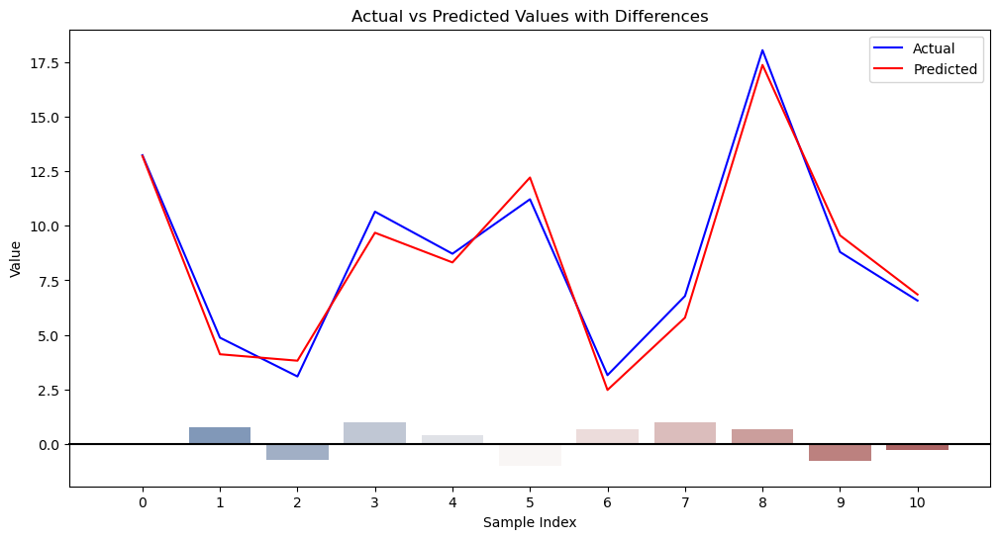

In [4]:
# Assuming flattened_df1 is your original DataFrame
df_temp = flattened_df1.copy()

# Start with the columns to keep as is
flattened_df1_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

# Excluding all features with "G1" and selecting only numeric features for clustering
feature_columns = [col for col in df_temp.columns if 'G2' not in col and df_temp[col].dtype.kind in 'fi']

# Apply K-Means clustering on the selected features
n_clusters = 7  # Adjust based on your dataset
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df_temp['Cluster'] = kmeans.fit_predict(df_temp[feature_columns])
#flattened_df1_adj_avg['Cluster'] = df_temp['Cluster']

# Calculate distances to each centroid
centroids = kmeans.cluster_centers_
for i in range(n_clusters):
    flattened_df1_adj_avg[f'Distance_to_Centroid_{i}'] = np.linalg.norm(df_temp[feature_columns] - centroids[i], axis=1)

# Loop through each group of features, excluding "G1"
for j in range(1, 2):  # Adjusted range to exclude G1
    for k in range(1, 6):  # Assuming F1 to F5
        all_positions_values = []

        for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
            col_prefix = f'D1 G{j} F{k}'
            position_col = f'{col_prefix} P{p}'
            if position_col in df_temp.columns:
                all_positions_values.append(df_temp[position_col])

                if p < 7 and f'{col_prefix} P{p+1}' in df_temp.columns:
                    new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
                    flattened_df1_adj_avg[new_col_name] = df_temp[[position_col, f'{col_prefix} P{p+1}']].mean(axis=1)

        # Concatenate all position values for this D1 GJ FK combination
        positions_df = pd.concat(all_positions_values, axis=1)

        # Calculate overall statistical measures
        #flattened_df1_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)

plot_actual_vs_predicted(LinearRegressionModel(flattened_df1_adj_avg))

In [37]:
# Assuming flattened_df1 is your original DataFrame
df_temp = flattened_df2.copy()

# Start with the columns to keep as is
flattened_df1_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

# Excluding all features with "G1" and selecting only numeric features for clustering
feature_columns = [col for col in df_temp.columns if 'G2' not in col and df_temp[col].dtype.kind in 'fi']

# Apply K-Means clustering on the selected features
n_clusters = 7  # Adjust based on your dataset
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df_temp['Cluster'] = kmeans.fit_predict(df_temp[feature_columns])
#flattened_df1_adj_avg['Cluster'] = df_temp['Cluster']

# Calculate distances to each centroid
centroids = kmeans.cluster_centers_
for i in range(n_clusters):
    flattened_df1_adj_avg[f'Distance_to_Centroid_{i}'] = np.linalg.norm(df_temp[feature_columns] - centroids[i], axis=1)

# Loop through each group of features, excluding "G1"
for j in range(1, 2):  # Adjusted range to exclude G1
    for k in range(1, 6):  # Assuming F1 to F5
        all_positions_values = []

        for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
            col_prefix = f'D2 G{j} F{k}'
            position_col = f'{col_prefix} P{p}'
            if position_col in df_temp.columns:
                all_positions_values.append(df_temp[position_col])

                if p < 7 and f'{col_prefix} P{p+1}' in df_temp.columns:
                    new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
                    flattened_df1_adj_avg[new_col_name] = df_temp[[position_col, f'{col_prefix} P{p+1}']].mean(axis=1)

        # Concatenate all position values for this D1 GJ FK combination
        positions_df = pd.concat(all_positions_values, axis=1)

        # Calculate overall statistical measures
        #flattened_df1_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)

        
LinearRegressionModel(flattened_df1_adj_avg)

Baseline Model RMSE: 1.0185555670160813
Baseline Model R-squared: 0.9439278852198418
    Actual  Predicted
0    13.24  10.848207
1     4.87   3.723657
2     3.09   2.544666
3    10.65  12.177693
4     8.72   8.586065
5    11.22  10.912041
6     3.15   2.310484
7     6.78   6.291045
8    18.06  17.895215
9     8.80   8.541269
10    6.57   7.341531


In [ ]:
# Assuming flattened_df1 is your original DataFrame
df_temp = flattened_df1.copy()

# Start with the columns to keep as is
flattened_df1_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

# Excluding all features with "G1" and selecting only numeric features for clustering
feature_columns = [col for col in df_temp.columns if 'G2' not in col and df_temp[col].dtype.kind in 'fi']

# Apply K-Means clustering on the selected features
n_clusters = 7  # Adjust based on your dataset
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df_temp['Cluster'] = kmeans.fit_predict(df_temp[feature_columns])
flattened_df1_adj_avg['Cluster'] = df_temp['Cluster']

# Calculate distances to each centroid
centroids = kmeans.cluster_centers_
for i in range(n_clusters):
    flattened_df1_adj_avg[f'Distance_to_Centroid_{i}'] = np.linalg.norm(df_temp[feature_columns] - centroids[i], axis=1)

# Loop through each group of features, excluding "G1"
for j in range(1, 2):  # Adjusted range to exclude G1
    for k in range(1, 6):  # Assuming F1 to F5
        all_positions_values = []

        for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
            col_prefix = f'D1 G{j} F{k}'
            position_col = f'{col_prefix} P{p}'
            if position_col in df_temp.columns:
                all_positions_values.append(df_temp[position_col])

                if p < 7 and f'{col_prefix} P{p+1}' in df_temp.columns:
                    new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
                    flattened_df1_adj_avg[new_col_name] = df_temp[[position_col, f'{col_prefix} P{p+1}']].mean(axis=1)

        # Concatenate all position values for this D1 GJ FK combination
        positions_df = pd.concat(all_positions_values, axis=1)

        # Calculate overall statistical measures
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)

        
LinearRegressionModel(flattened_df1_adj_avg)

In [41]:
# Assuming flattened_df1 is your original DataFrame
df_temp = flattened_df1.copy()

# Start with the columns to keep as is
flattened_df1_adj_avg = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

feature_columns = [col for col in df_temp.columns if 'D1 G' in col or 'D2 G' in col]

# Ensure that the feature_columns list only contains columns that exist in df_temp
n_clusters = 7 # Adjust based on your dataset

# Apply K-Means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df_temp['Cluster'] = kmeans.fit_predict(df_temp[feature_columns])
flattened_df1_adj_avg['Cluster'] = df_temp['Cluster']

# Calculate distances to each centroid
centroids = kmeans.cluster_centers_
for i in range(n_clusters):
    flattened_df1_adj_avg[f'Distance_to_Centroid_{i}'] = np.linalg.norm(df_temp[feature_columns] - centroids[i], axis=1)

# Loop through each group of features
for j in range(1, 3):  # Assuming G1 to G2
    for k in range(1, 6):  # Assuming F1 to F5
        all_positions_values = []

        for p in range(1, 7):  # Adjacent positions, 1 to 6 for averaging
            col_prefix = f'D1 G{j} F{k}'
            position_col = f'{col_prefix} P{p}'
            all_positions_values.append(df_temp[position_col])

            if p < 7:
                new_col_name = f'{col_prefix} P{p}_P{p+1}_avg'
                flattened_df1_adj_avg[new_col_name] = df_temp[[position_col, f'{col_prefix} P{p+1}']].mean(axis=1)

        # Concatenate all position values for this D1 GJ FK combination
        positions_df = pd.concat(all_positions_values, axis=1)

        # Calculate overall statistical measures
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Mean'] = positions_df.mean(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Min'] = positions_df.min(axis=1)
        flattened_df1_adj_avg[f'{col_prefix} All_Positions_Max'] = positions_df.max(axis=1)

LinearRegressionModel(flattened_df1_adj_avg)
RandomForestRegressionModel(flattened_df1_adj_avg)
RandomForestClassifierModel(flattened_df1_adj_avg)

Baseline Model RMSE: 5.425943596223667
    Actual  Predicted
0    13.24  11.234583
1     4.87  13.262312
2     3.09   7.642288
3    10.65  18.882094
4     8.72   8.005381
5    11.22   6.958891
6     3.15  -2.320021
7     6.78  11.012349
8    18.06  15.187662
9     8.80  -0.477335
10    6.57   6.862055
Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 100}
Optimized Model RMSE: 4.193432140318302
    Actual  Predicted
0    13.24    11.2902
1     4.87     5.6700
2     3.09     8.0543
3    10.65     8.7317
4     8.72     6.1715
5    11.22     6.8584
6     3.15     7.8020
7     6.78     9.9580
8    18.06     7.9484
9     8.80     8.1942
10    6.57     7.4628
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters: {'max_depth': 10, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Cross-Validated Accuracy: 0.725


In [49]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance

# Assuming flattened_df1_adj_avg is already loaded

# Preprocessing
X = flattened_df1_adj_avg.drop(['ID', 'Output Measured Value', 'Strength'], axis=1)
y = flattened_df1_adj_avg['Strength']

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42)

# Extensive parameter tuning with GridSearchCV
param_grid = {
    'C': [0.1, 1, 10, 100, 1000],
    'gamma': [0.001, 0.01, 0.1, 1, 'scale', 'auto'],
    'kernel': ['linear', 'rbf', 'poly'],
    'degree': [2, 3, 4],  # only used for 'poly' kernel
    'coef0': [0.0, 0.1, 0.5, 1]  # only used for 'poly' and 'sigmoid' kernels
}

grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# Train the model with best parameters
best_model = SVC(**best_params)
best_model.fit(X_train, y_train)

# Evaluate the model
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy:.2f}")

# Feature Importance using Permutation Importance
perm_importance = permutation_importance(best_model, X_test, y_test, n_repeats=30, random_state=42)
sorted_idx = perm_importance.importances_mean.argsort()

# Displaying feature importances
importance_df = pd.DataFrame({
    'Feature': X.columns[sorted_idx],
    'Importance': perm_importance.importances_mean[sorted_idx]
}).sort_values(by='Importance', ascending=False)
print(importance_df)


Fitting 5 folds for each of 1080 candidates, totalling 5400 fits
Best parameters: {'C': 1, 'coef0': 0.5, 'degree': 2, 'gamma': 0.01, 'kernel': 'poly'}
Model Accuracy: 0.62
                        Feature  Importance
97           D1 G2 F2 P1_P2_avg    0.095833
96   D1 G2 F2 All_Positions_Max    0.058333
95   D1 G2 F1 All_Positions_Min    0.054167
94   D1 G2 F4 All_Positions_Min    0.054167
93           D1 G2 F2 P2_P3_avg    0.045833
..                          ...         ...
30           D1 G2 F4 P6_P7_avg    0.000000
29  D1 G2 F4 All_Positions_Mean    0.000000
28   D1 G2 F4 All_Positions_Max    0.000000
27           D1 G2 F5 P1_P2_avg    0.000000
49  D1 G1 F2 All_Positions_Mean    0.000000

[98 rows x 2 columns]


In [50]:
importance_df.head(50)


,Feature,Importance
97,D1 G2 F2 P1_P2_avg,0.095833
96,D1 G2 F2 All_Positions_Max,0.058333
95,D1 G2 F1 All_Positions_Min,0.054167
94,D1 G2 F4 All_Positions_Min,0.054167
93,D1 G2 F2 P2_P3_avg,0.045833
92,D1 G2 F4 P1_P2_avg,0.045833
91,D1 G2 F1 P1_P2_avg,0.045833
90,D1 G2 F3 All_Positions_Min,0.037500
89,D1 G2 F3 P1_P2_avg,0.029167
88,Distance_to_Centroid_3,0.020833


In [77]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Assuming flattened_df1 is your DataFrame
df = flattened_df1.copy()

# StandardScaler instance
scaler = StandardScaler()

# Dictionary to store cluster labels for each position
clusters_per_position = {}

# Perform clustering for each position
for position in range(1, 8):  # P1 to P7
    # Selecting features for the current position
    position_features = df.filter(regex=f'P{position}').columns
    
    # Standardizing the features for the current position
    X_scaled = scaler.fit_transform(df[position_features])
    
    # Apply K-Means clustering for the current position
    kmeans = KMeans(n_clusters=10, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)
    
    # Storing the cluster labels
    clusters_per_position[f'Cluster_P{position}'] = clusters

# Add the cluster labels for each position to the DataFrame
for position_label, clusters in clusters_per_position.items():
    df[position_label] = clusters
RandomForestClassifierModel(df)
df

Fitting 3 folds for each of 216 candidates, totalling 648 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}
Model Accuracy: 0.5454545454545454
              precision    recall  f1-score   support

        High       0.50      0.50      0.50         2
         Low       0.50      0.67      0.57         3
    Moderate       0.60      0.50      0.55         6

    accuracy                           0.55        11
   macro avg       0.53      0.56      0.54        11
weighted avg       0.55      0.55      0.54        11

      Actual Predicted
0       High      High
1        Low       Low
2        Low  Moderate
3   Moderate  Moderate
4   Moderate       Low
5   Moderate       Low
6        Low       Low
7   Moderate      High
8       High  Moderate
9   Moderate  Moderate
10  Moderate  Moderate


,ID,Output Measured Value,Strength,D1 G1 F1 P1,D1 G1 F1 P2,D1 G1 F1 P3,D1 G1 F1 P4,D1 G1 F1 P5,D1 G1 F1 P6,D1 G1 F1 P7,...,D1 G2 F5 P5,D1 G2 F5 P6,D1 G2 F5 P7,Cluster_P1,Cluster_P2,Cluster_P3,Cluster_P4,Cluster_P5,Cluster_P6,Cluster_P7
0,1.0,8.30,Moderate,0.793402,0.894067,1.000000,0.846658,0.412638,0.357420,0.433507,...,0.163248,0.250184,0.240547,0,7,4,8,1,2,5
1,2.0,8.68,Moderate,0.413516,0.400822,0.370479,0.343052,0.379813,0.621895,0.605085,...,0.247584,0.186132,0.084248,6,8,2,5,1,1,1
2,3.0,10.83,Moderate,0.490710,0.533898,0.462451,0.403085,0.508842,0.607635,0.704176,...,0.103898,0.191843,0.164141,6,0,2,4,3,6,1
3,4.0,14.26,High,0.605390,0.548463,0.535641,0.511731,0.432102,0.442521,0.497285,...,0.141431,0.238712,0.149820,0,0,7,4,0,0,3
4,5.0,13.17,High,0.277146,0.310052,0.475830,0.643505,0.764163,0.768902,0.653663,...,0.224774,0.256621,0.144457,8,9,1,1,5,6,0
5,6.0,12.97,High,0.499430,0.513137,0.515575,0.480100,0.460357,0.430187,0.510282,...,0.092310,0.138991,0.073490,6,1,2,4,0,3,3
6,7.0,17.20,High,0.220673,0.207938,0.363167,0.510662,0.580988,0.738933,0.775432,...,0.172132,0.099862,0.103980,1,5,6,0,7,1,1
7,8.0,16.85,High,0.419655,0.473993,0.563109,0.612697,0.628324,0.643236,0.689022,...,0.200879,0.298519,0.239012,8,3,1,1,5,6,0
8,9.0,18.06,High,0.621044,0.612164,0.611645,0.604536,0.520074,0.518778,0.486869,...,0.230962,0.088647,0.083835,0,0,7,4,7,9,0
9,10.0,6.57,Moderate,0.563587,0.586084,0.607991,0.541466,0.516468,0.496740,0.495889,...,0.102367,0.115536,0.081913,6,0,7,4,3,3,3


In [26]:
# Assuming df_temp is your DataFrame
df_temp = flattened_df1.copy()  # Replace this with your actual df_temp

# Initialize DataFrame to store PCA results
pca_results = df_temp[['ID', 'Output Measured Value', 'Strength']].copy()

# Apply PCA to each D1 GY FZ combination
for j in range(1, 3):  # Assuming G1 to G2
    for k in range(1, 6):  # Assuming F1 to F5
        features = [f'D1 G{j} F{k} P{i}' for i in range(1, 8)]
        
        # Check if features are in the DataFrame
        if all(item in df_temp.columns for item in features):
            df_features = df_temp[features]

            # Standardizing the features
            scaler = StandardScaler()
            df_features_scaled = scaler.fit_transform(df_features)

            # Apply PCA
            pca = PCA(n_components=2)  # You can adjust n_components as needed
            principal_components = pca.fit_transform(df_features_scaled)

            # Create a DataFrame for the principal components
            df_pcs = pd.DataFrame(data=principal_components, columns=[f'D1 G{j} F{k} PC1', f'D1 G{j} F{k} PC2'])
            pca_results = pd.concat([pca_results, df_pcs], axis=1)


LinearRegressionModel(pca_results)
RandomForestRegressionModel(pca_results)
RandomForestClassifierModel(pca_results)

Baseline Model RMSE: 18.466396391016882
    Actual  Predicted
0    13.24  34.941931
1     4.87   6.249758
2     3.09  -3.897295
3    10.65  43.913741
4     8.72   5.433590
5    11.22 -31.501043
6     3.15   7.426181
7     6.78  15.418300
8    18.06   4.584625
9     8.80  12.284693
10    6.57   5.948150
Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 10, 'n_estimators': 200}
Optimized Model RMSE: 3.9707505166642276
    Actual  Predicted
0    13.24   9.999083
1     4.87   6.129406
2     3.09   7.192319
3    10.65   7.565194
4     8.72   7.771690
5    11.22   6.962147
6     3.15   7.239124
7     6.78  10.097032
8    18.06   8.795963
9     8.80   8.141411
10    6.57   7.981524
Fitting 3 folds for each of 216 candidates, totalling 648 fits
Best parameters: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50}
Model Accuracy: 0.5454545454545454


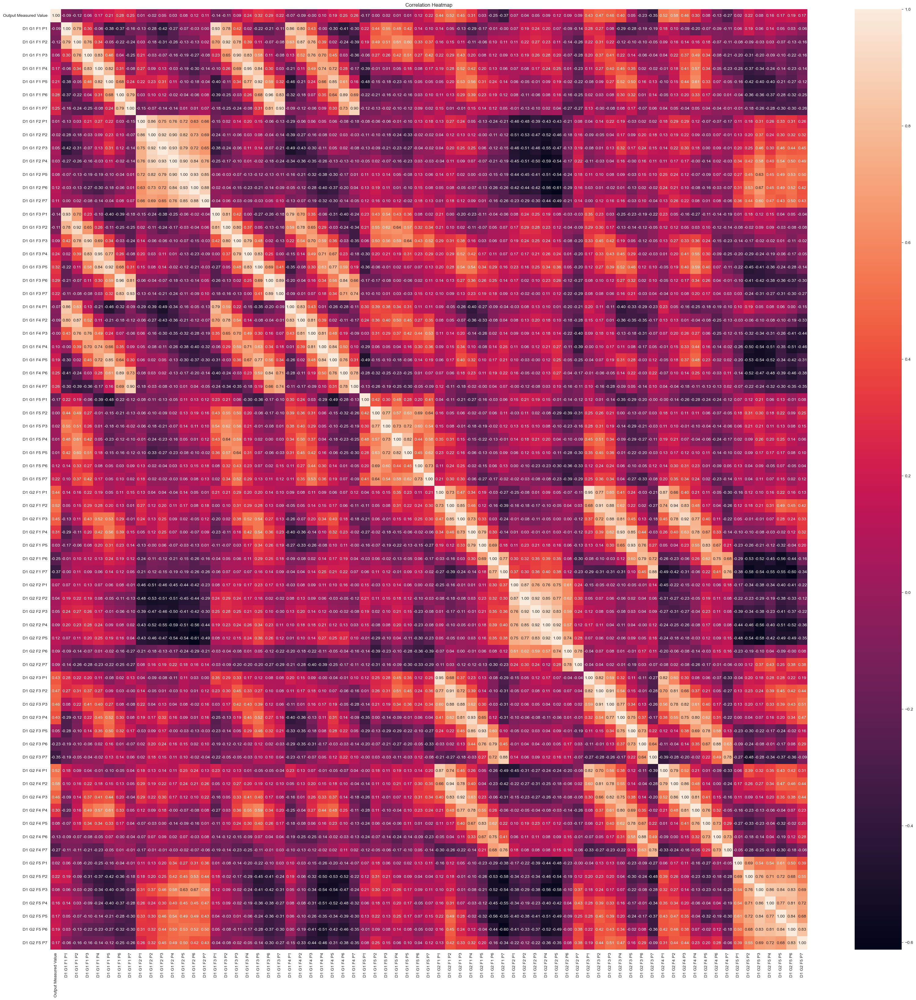

In [41]:
correlation_matrix = flattened_df1.drop(['ID', 'Strength'], axis=1).corr()
 # Heatmap of the correlation matrix
plt.figure(figsize=(40,40))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()
 

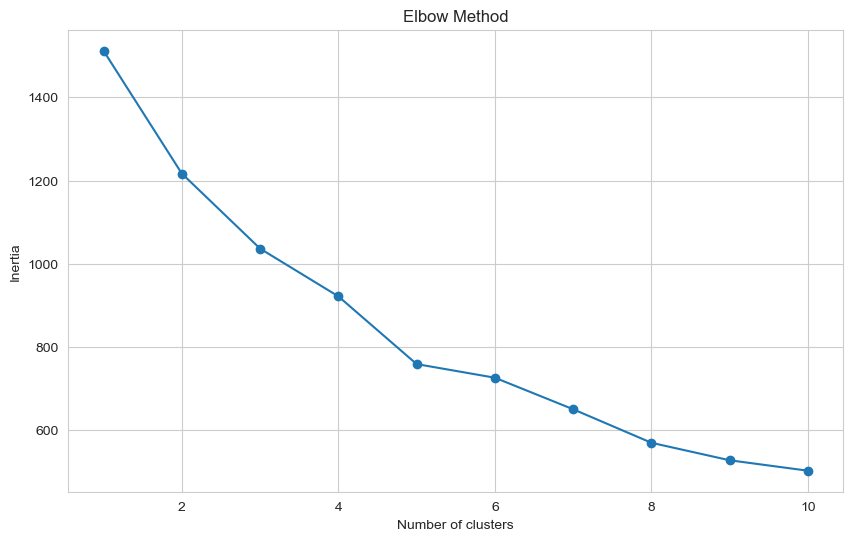

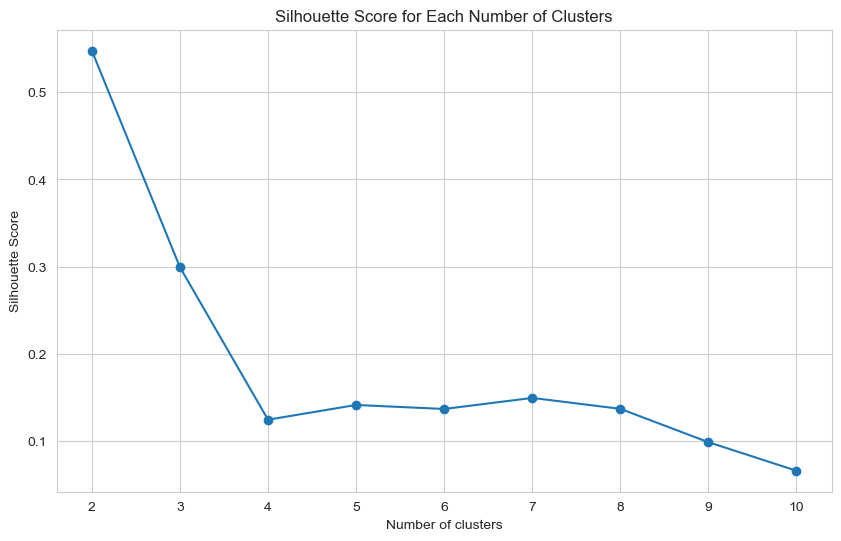

,Output Measured Value,D1 G1 F1 P1,D1 G1 F1 P2,D1 G1 F1 P3,D1 G1 F1 P4,D1 G1 F1 P5,D1 G1 F1 P6,D1 G1 F1 P7,D1 G1 F2 P1,D1 G1 F2 P2,...,D1 G2 F2 P6,D1 G2 F2 P7,D1 G2 F5 P1,D1 G2 F5 P2,D1 G2 F5 P3,D1 G2 F5 P4,D1 G2 F5 P5,D1 G2 F5 P6,D1 G2 F5 P7,Cluster
0,8.30,0.793402,0.894067,1.000000,0.846658,0.412638,0.357420,0.433507,0.458754,0.186308,...,0.465145,0.494660,0.124061,0.119244,0.158815,0.342534,0.163248,0.250184,0.240547,0
1,8.68,0.413516,0.400822,0.370479,0.343052,0.379813,0.621895,0.605085,0.281924,0.309128,...,0.313840,0.356062,0.203585,0.211393,0.185442,0.193560,0.247584,0.186132,0.084248,0
2,10.83,0.490710,0.533898,0.462451,0.403085,0.508842,0.607635,0.704176,0.371044,0.453239,...,0.316783,0.411134,0.113238,0.089909,0.169577,0.168128,0.103898,0.191843,0.164141,0
3,14.26,0.605390,0.548463,0.535641,0.511731,0.432102,0.442521,0.497285,0.494941,0.522718,...,0.408720,0.316359,0.098212,0.136095,0.141034,0.118873,0.141431,0.238712,0.149820,0
4,13.17,0.277146,0.310052,0.475830,0.643505,0.764163,0.768902,0.653663,0.518605,0.462811,...,0.500272,0.500974,0.131804,0.110324,0.135918,0.142337,0.224774,0.256621,0.144457,0
5,12.97,0.499430,0.513137,0.515575,0.480100,0.460357,0.430187,0.510282,0.537422,0.509415,...,0.440585,0.534817,0.110743,0.128530,0.139098,0.145860,0.092310,0.138991,0.073490,0
6,17.20,0.220673,0.207938,0.363167,0.510662,0.580988,0.738933,0.775432,0.424836,0.483381,...,0.533619,0.602331,0.241568,0.151452,0.161746,0.152044,0.172132,0.099862,0.103980,0
7,16.85,0.419655,0.473993,0.563109,0.612697,0.628324,0.643236,0.689022,0.401743,0.346015,...,0.398354,0.284672,0.292482,0.268135,0.175152,0.163651,0.200879,0.298519,0.239012,0
8,18.06,0.621044,0.612164,0.611645,0.604536,0.520074,0.518778,0.486869,0.543779,0.489132,...,0.541720,0.517002,0.223804,0.302374,0.171100,0.255045,0.230962,0.088647,0.083835,0
9,6.57,0.563587,0.586084,0.607991,0.541466,0.516468,0.496740,0.495889,0.567517,0.567953,...,0.464435,0.528642,0.127597,0.082681,0.097625,0.117799,0.102367,0.115536,0.081913,0


In [39]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming flattened_df1 is your DataFrame
df = flattened_df1.drop(['ID', 'Strength'], axis=1).drop([col for col in df.columns if 'F3' in col or 'F4' in col], axis=1)

# Include only columns that start with 'D'
d_columns = [col for col in df.columns if col.startswith('D')]
df_d_only = df[d_columns]

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_d_only)

# Elbow Method to find the optimal number of clusters
inertia = []
for i in range(1, 11):  # Testing 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

# Silhouette Score analysis
silhouette_scores = []
for i in range(2, 11):  # Can't compute silhouette score for one cluster
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(df_scaled)
    score = silhouette_score(df_scaled, kmeans.labels_)
    silhouette_scores.append(score)

# Plotting the Silhouette Scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Score for Each Number of Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

# Choosing the number of clusters based on Elbow Method and Silhouette Score
# Let's say we choose n_clusters = x based on the analysis
x = 2
kmeans_final = KMeans(n_clusters=x, init='k-means++', random_state=42)
clusters = kmeans_final.fit_predict(df_scaled)

# Add the cluster labels to your original DataFrame
df['Cluster'] = clusters
df

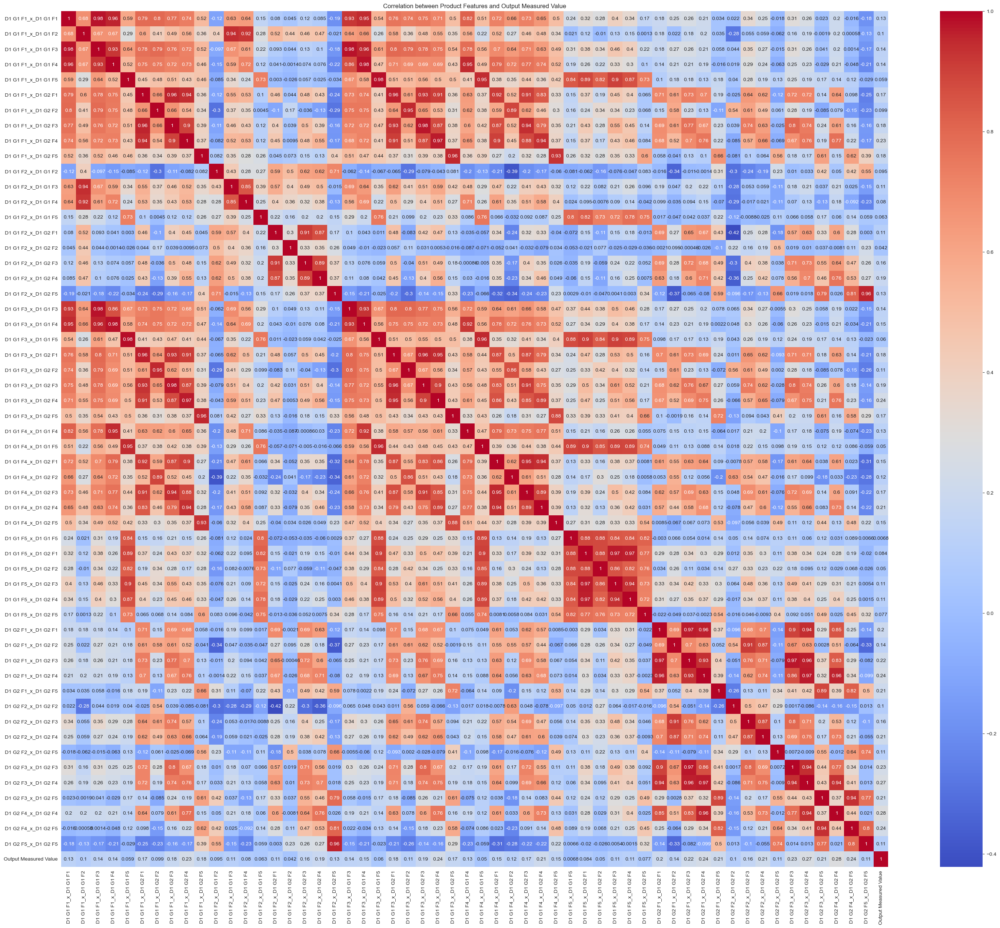

In [8]:
# Assuming df1 is your original DataFrame
feature_columns = [col for col in df1.columns if col not in ['ID', 'Output Measured Value', 'Strength', 'Position']]

# Create a new DataFrame for the product features
df_product = pd.DataFrame()

# Generate all combinations of product features
for i in range(len(feature_columns)):
    for j in range(i, len(feature_columns)):
        new_col_name = f"{feature_columns[i]}_x_{feature_columns[j]}"
        df_product[new_col_name] = df1[feature_columns[i]] * df1[feature_columns[j]]

# Add the output variable to the new DataFrame
df_product['Output Measured Value'] = df1['Output Measured Value']

# Calculate correlation
correlation_matrix = df_product.corr()

# Plotting the correlation matrix
plt.figure(figsize=(36, 30))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation between Product Features and Output Measured Value")
plt.show()


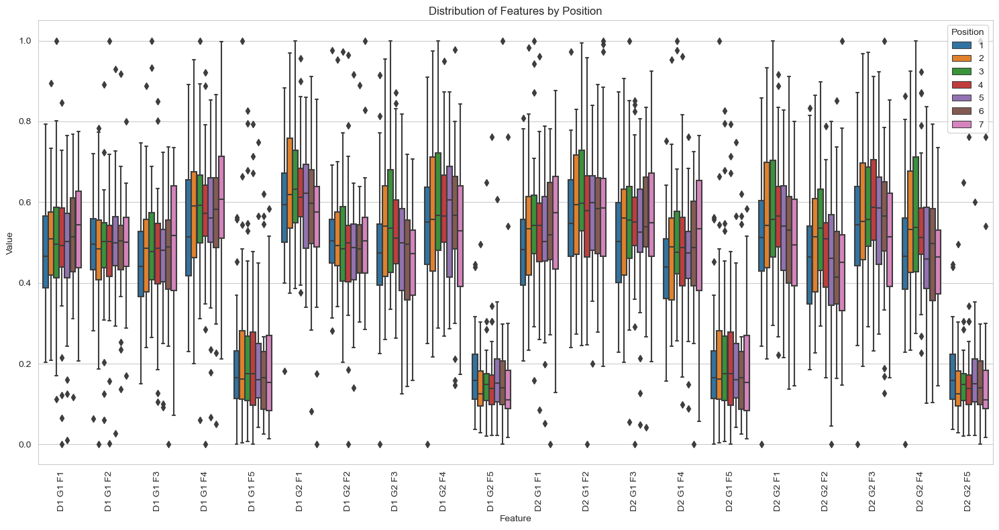

In [39]:
# Select only the columns that start with 'D2' and 'Position'
selected_columns = [col for col in df.columns if col.startswith('D')] + ['Position']
melted_df = df[selected_columns].melt(id_vars=['Position'], var_name='Feature', value_name='Value')


plt.figure(figsize=(15, 8))
sns.boxplot(x='Feature', y='Value', hue='Position', data=melted_df)
plt.xticks(rotation=90)  # Rotate the x labels for better readability
plt.title('Distribution of Features by Position')
plt.xlabel('Feature')
plt.ylabel('Value')
plt.legend(title='Position')
plt.tight_layout()
plt.show()


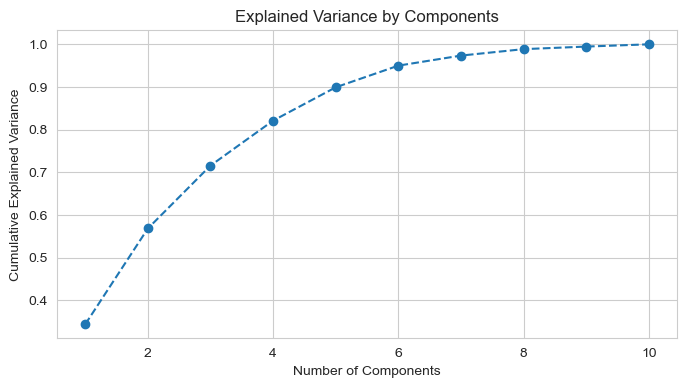

In [68]:

# Assuming 'df' is your DataFrame
feature_columns = [col for col in df1.columns if col != 'Output Measured Value' and col != 'ID' and col != 'Position']
X = df1[feature_columns]

# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Applying PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Plotting the Cumulative Summation of the Explained Variance
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()


In [69]:
# Re-applying PCA with the chosen number of components
n_components = 8
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)
X_pca

array([[-3.42947536, -0.49030984,  0.09467187, ...,  0.0538088 ,
        -0.79227474,  0.61242727],
       [-5.43351622, -1.61605715, -0.46111639, ...,  0.69119504,
        -0.93291232,  0.56854667],
       [-5.60904294, -2.75890722,  0.35052192, ...,  0.39717788,
        -1.45684502,  0.09096831],
       ...,
       [-3.38042301,  0.34830141,  0.34422237, ...,  0.07687733,
         0.38163116, -0.36775448],
       [-3.46121528,  1.27996848,  0.08409238, ...,  0.73242627,
         0.22787256, -0.61969923],
       [-1.85358714,  2.03648066,  1.55642537, ...,  1.21493884,
        -0.60815613, -0.62571526]])

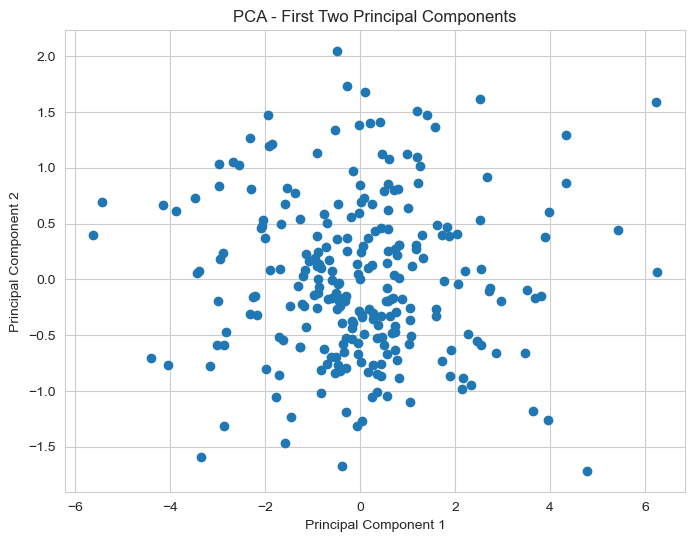

In [70]:


# Assuming X_pca is your PCA-transformed data and it has at least 2 components
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 5])  # Plotting the first two components
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA - First Two Principal Components')
plt.show()


In [71]:

# Assuming df1 is your DataFrame
df1 = df1.drop([col for col in df1.columns if 'F3' in col or 'F4' in col], axis=1)

# Calculate the Total Feature Sum and Position Feature Sum
feature_columns = [col for col in df1.columns if col.startswith('D1')]
df1['Total_Feature_Sum'] = df1.groupby('ID')[feature_columns].transform('sum').sum(axis=1)
df1['Position_Feature_Sum'] = df1[feature_columns].sum(axis=1)

# Allocate output value to each position
df1['Allocated_Output'] = (df1['Position_Feature_Sum'] / df1['Total_Feature_Sum']) * df1['Output Measured Value']



In [72]:
# Include 'ID' in the features for tracking, but not for training
X = df1[['ID'] + feature_columns]
y = df1['Allocated_Output']


# Create a GroupShuffleSplit instance
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

# Splitting based on ID
for train_idx, test_idx in gss.split(X, y, groups=df1['ID']):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

# Extracting 'ID' for aggregation purposes
train_ids = X_train['ID']
test_ids = X_test['ID']

# Drop 'ID' for training and prediction
X_train = X_train.drop('ID', axis=1)
X_test = X_test.drop('ID', axis=1)


# Train the model as before
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [73]:
# Making predictions
y_pred = model.predict(X_test)

# Re-integrating IDs with predictions
X_test_with_pred = X_test.copy()
X_test_with_pred['ID'] = test_ids.values  # Re-adding the IDs
X_test_with_pred['Predicted_Allocated_Output'] = y_pred

# Group by ID and sum the predicted allocated output
predicted_output_per_building = X_test_with_pred.groupby('ID')['Predicted_Allocated_Output'].sum()

# Retrieve the actual output per building
actual_output_per_building = df1.drop_duplicates('ID').set_index('ID')['Output Measured Value']

# Comparing predicted sum with actual output
comparison_df = pd.DataFrame({'Actual_Output': actual_output_per_building, 
                              'Predicted_Output': predicted_output_per_building})

comparison_df = comparison_df.dropna()
# Calculate the RMSE on the building level
building_level_rmse = np.sqrt(mean_squared_error(comparison_df['Actual_Output'], 
                                                 comparison_df['Predicted_Output'].reindex(comparison_df.index)))
print(f'Building Level RMSE: {building_level_rmse}')

# Display first few rows of the comparison
print(comparison_df.head())


Building Level RMSE: 3.7090170749881306
      Actual_Output  Predicted_Output
ID                                   
13.0           6.78         10.744457
14.0           4.87          8.181691
17.0           8.72          7.034987
22.0           3.15          7.261394
27.0           3.09         10.185051


In [74]:


# Selecting a subset of features for creating interactions
# It's better to start with a few features to avoid combinatorial explosion
selected_features = [col for col in df.columns if col.startswith('D1')]  # Adjust as necessary
interaction_pairs = list(itertools.combinations(selected_features, 2))  # Create pairs for interaction

# Create interaction terms
for pair in interaction_pairs:
    df[f'interaction_{pair[0]}_{pair[1]}'] = df[pair[0]] * df[pair[1]]


In [75]:
interaction_pairs

[('D1 G1 F1', 'D1 G1 F2'),
 ('D1 G1 F1', 'D1 G1 F3'),
 ('D1 G1 F1', 'D1 G1 F4'),
 ('D1 G1 F1', 'D1 G1 F5'),
 ('D1 G1 F1', 'D1 G2 F1'),
 ('D1 G1 F1', 'D1 G2 F2'),
 ('D1 G1 F1', 'D1 G2 F3'),
 ('D1 G1 F1', 'D1 G2 F4'),
 ('D1 G1 F1', 'D1 G2 F5'),
 ('D1 G1 F2', 'D1 G1 F3'),
 ('D1 G1 F2', 'D1 G1 F4'),
 ('D1 G1 F2', 'D1 G1 F5'),
 ('D1 G1 F2', 'D1 G2 F1'),
 ('D1 G1 F2', 'D1 G2 F2'),
 ('D1 G1 F2', 'D1 G2 F3'),
 ('D1 G1 F2', 'D1 G2 F4'),
 ('D1 G1 F2', 'D1 G2 F5'),
 ('D1 G1 F3', 'D1 G1 F4'),
 ('D1 G1 F3', 'D1 G1 F5'),
 ('D1 G1 F3', 'D1 G2 F1'),
 ('D1 G1 F3', 'D1 G2 F2'),
 ('D1 G1 F3', 'D1 G2 F3'),
 ('D1 G1 F3', 'D1 G2 F4'),
 ('D1 G1 F3', 'D1 G2 F5'),
 ('D1 G1 F4', 'D1 G1 F5'),
 ('D1 G1 F4', 'D1 G2 F1'),
 ('D1 G1 F4', 'D1 G2 F2'),
 ('D1 G1 F4', 'D1 G2 F3'),
 ('D1 G1 F4', 'D1 G2 F4'),
 ('D1 G1 F4', 'D1 G2 F5'),
 ('D1 G1 F5', 'D1 G2 F1'),
 ('D1 G1 F5', 'D1 G2 F2'),
 ('D1 G1 F5', 'D1 G2 F3'),
 ('D1 G1 F5', 'D1 G2 F4'),
 ('D1 G1 F5', 'D1 G2 F5'),
 ('D1 G2 F1', 'D1 G2 F2'),
 ('D1 G2 F1', 'D1 G2 F3'),
 

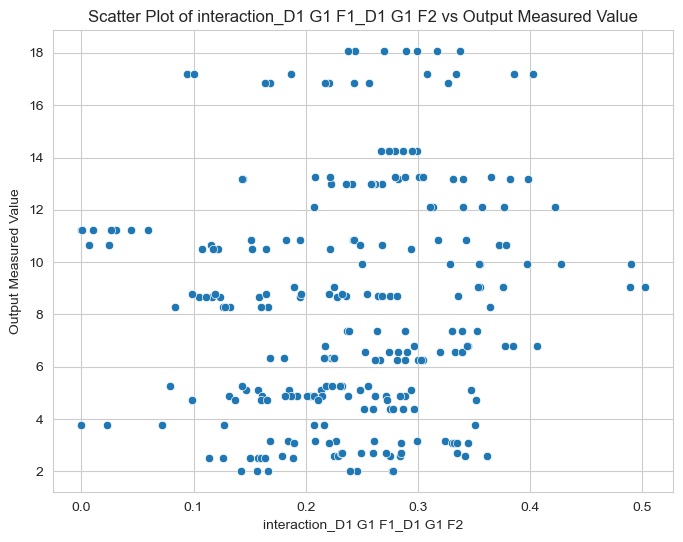

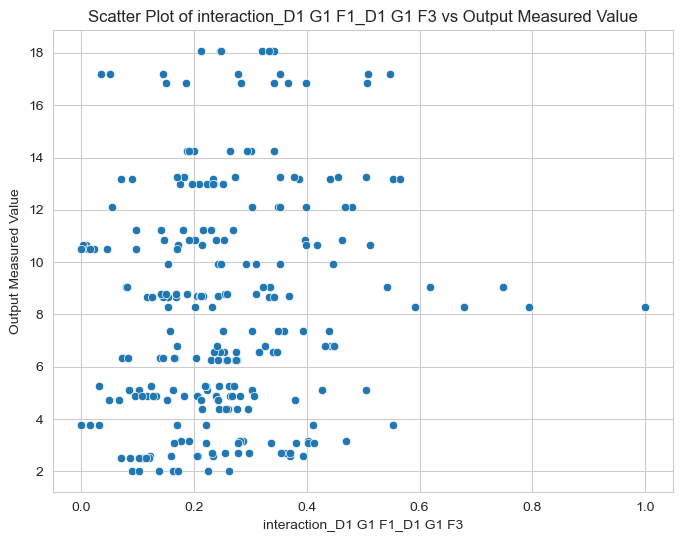

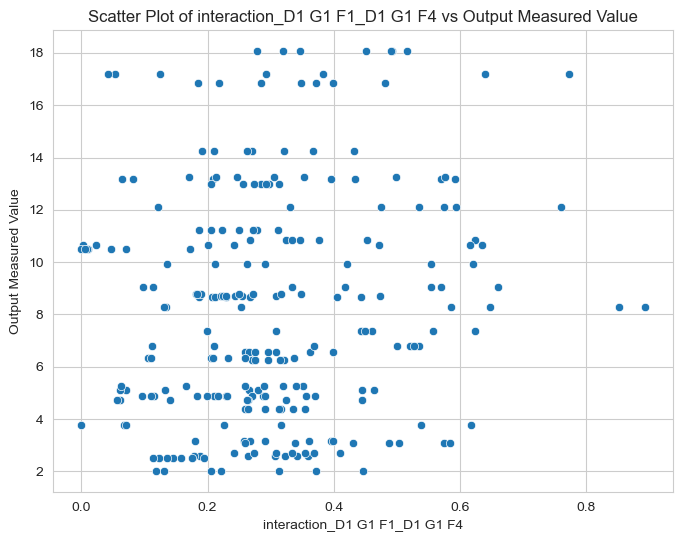

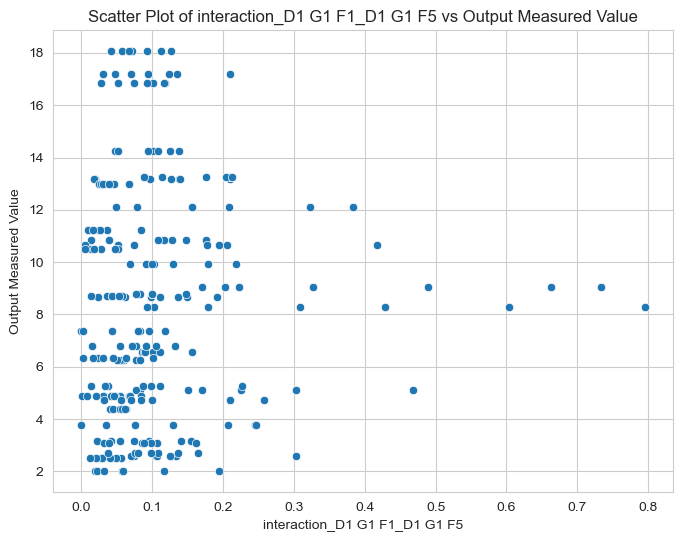

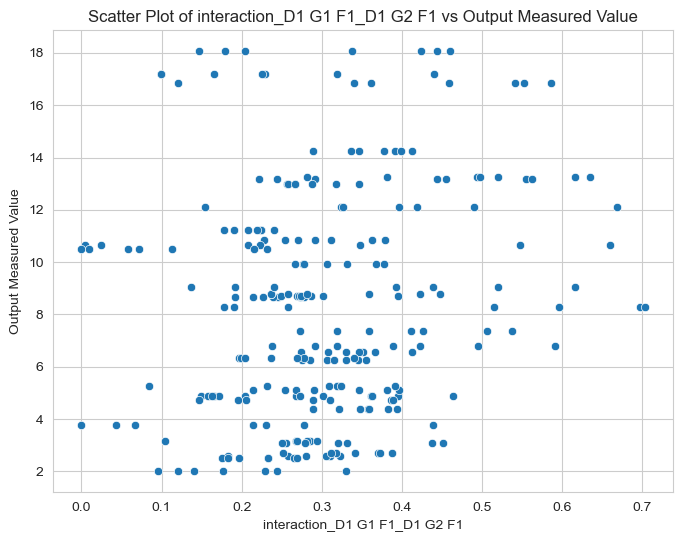

...

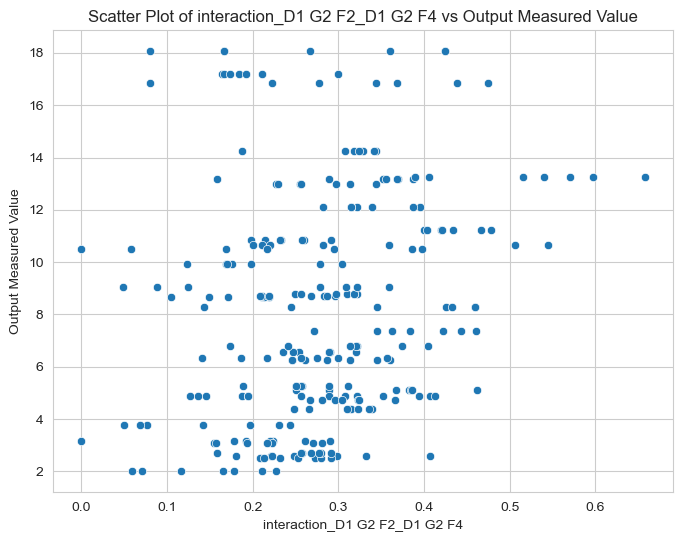

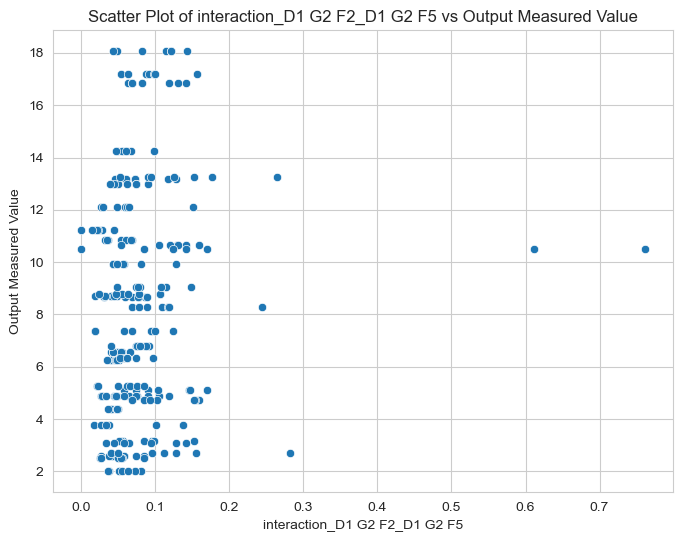

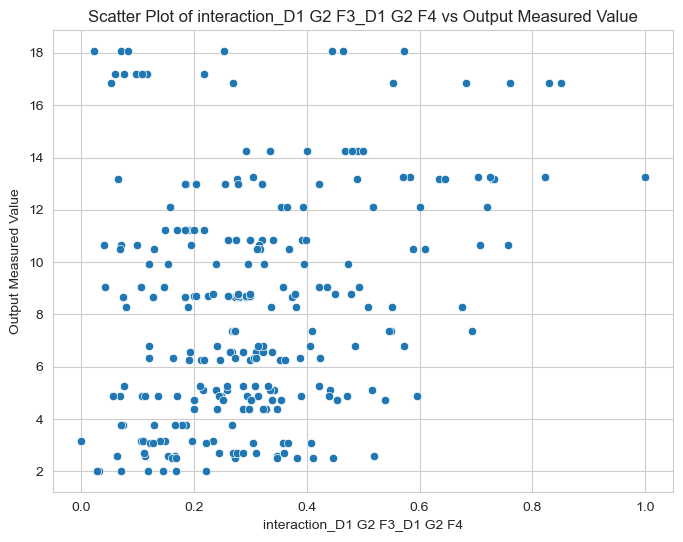

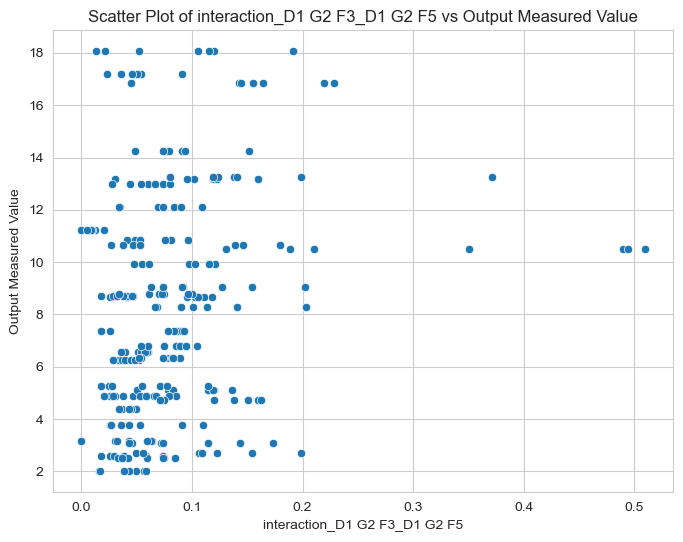

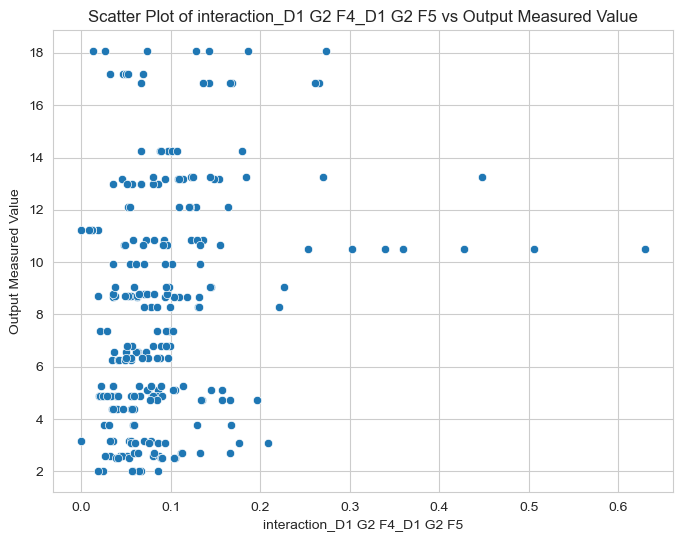

In [76]:


# Loop through each interaction feature and create a scatter plot
for interaction in df.columns[df.columns.str.startswith('interaction_')]:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df[interaction], y=df['Output Measured Value'])
    plt.title(f'Scatter Plot of {interaction} vs Output Measured Value')
    plt.xlabel(interaction)
    plt.ylabel('Output Measured Value')
    plt.show()


In [77]:
df1 = df1.drop([col for col in df1.columns if '_' in col], axis=1)

In [78]:

# Assuming df1 is your DataFrame

# Duplicate the DataFrame for Group 2
df1_group1 = df1.copy()
df1_group1.drop(['D1 G2 F1', 'D1 G2 F2', 'D1 G2 F5'], axis=1, inplace=True)
df1_group1.rename(columns={'D1 G1 F1': 'F1', 'D1 G1 F2': 'F2', 'D1 G1 F5': 'F5'}, inplace=True)

df1_group2 = df1.copy()

# Adjust the duplicated DataFrame to represent Group 2 features
# Mapping Group 2 features to the Group 1 columns
df1_group2['D1 G1 F1'] = df1_group2['D1 G2 F1']
df1_group2['D1 G1 F2'] = df1_group2['D1 G2 F2']
df1_group2['D1 G1 F5'] = df1_group2['D1 G2 F5']

# Drop the original Group 2 columns from the duplicated DataFrame
df1_group2.drop(['D1 G2 F1', 'D1 G2 F2', 'D1 G2 F5'], axis=1, inplace=True)

# Rename the columns to a unified format (F1, F2, F5)
df1_group2.rename(columns={'D1 G1 F1': 'F1', 'D1 G1 F2': 'F2', 'D1 G1 F5': 'F5'}, inplace=True)
df1_group2['Position'] = df1_group2['Position'] + 7

# Append the modified duplicated DataFrame to the original DataFrame
df1_combined = pd.concat([df1_group1, df1_group2], ignore_index=True)

# Sorting the DataFrame based on ID and Position
df1_combined.sort_values(by=['ID', 'Position'], inplace=True)

# Resetting the index
df1_combined.reset_index(drop=True, inplace=True)

# Displaying the first few rows of the combined DataFrame
df1_combined.head()


,ID,Output Measured Value,Position,F1,F2,F5
0,1.0,8.3,1,0.793402,0.458754,0.128595
1,1.0,8.3,2,0.894067,0.186308,0.479431
2,1.0,8.3,3,1.000000,0.125957,0.795595
3,1.0,8.3,4,0.846658,0.156456,0.712682
4,1.0,8.3,5,0.412638,0.309618,0.748513


In [79]:
df1_combined[df1_combined['ID'] == 1]

,ID,Output Measured Value,Position,F1,F2,F5
0,1.0,8.3,1,0.793402,0.458754,0.128595
1,1.0,8.3,2,0.894067,0.186308,0.479431
2,1.0,8.3,3,1.000000,0.125957,0.795595
3,1.0,8.3,4,0.846658,0.156456,0.712682
4,1.0,8.3,5,0.412638,0.309618,0.748513
5,1.0,8.3,6,0.357420,0.234290,0.257479
6,1.0,8.3,7,0.433507,0.368768,0.413683
7,1.0,8.3,8,0.751515,0.552227,0.124061
8,1.0,8.3,9,0.779498,0.650727,0.119244
9,1.0,8.3,10,0.703294,0.684120,0.158815


In [80]:
# Creating a list to hold correlation results
position_correlations = []

# Looping through each position
for pos in range(1, 15):
    current_position_data = df1_combined[df1_combined['Position'] == pos]
    correlation = current_position_data[['F1', 'F2', 'F5', 'Output Measured Value']].corr()['Output Measured Value'].drop('Output Measured Value')
    position_correlations.append((pos, correlation))

# Displaying correlation for each position
for pos, corr in position_correlations:
    print(f"Position {pos} Correlations:\n{corr}\n")


Position 1 Correlations:
F1   -0.086991
F2    0.010892
F5   -0.174825
Name: Output Measured Value, dtype: float64

Position 2 Correlations:
F1   -0.121468
F2   -0.021993
F5    0.003087
Name: Output Measured Value, dtype: float64

Position 3 Correlations:
F1    0.056931
F2    0.051436
F5    0.018874
Name: Output Measured Value, dtype: float64

Position 4 Correlations:
F1    0.165261
F2    0.028543
F5    0.014390
Name: Output Measured Value, dtype: float64

Position 5 Correlations:
F1    0.209780
F2    0.079963
F5    0.006549
Name: Output Measured Value, dtype: float64

Position 6 Correlations:
F1    0.283825
F2    0.116976
F5    0.115738
Name: Output Measured Value, dtype: float64

Position 7 Correlations:
F1    0.252741
F2    0.108775
F5    0.222519
Name: Output Measured Value, dtype: float64

Position 8 Correlations:
F1    0.443421
F2    0.066426
F5    0.015104
Name: Output Measured Value, dtype: float64

Position 9 Correlations:
F1    0.518539
F2    0.040891
F5    0.215780
Name: Outp

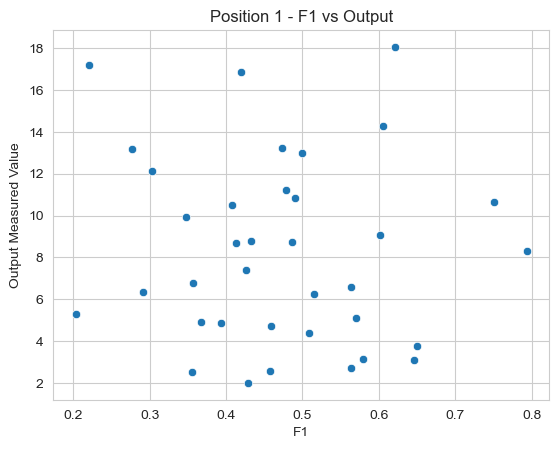

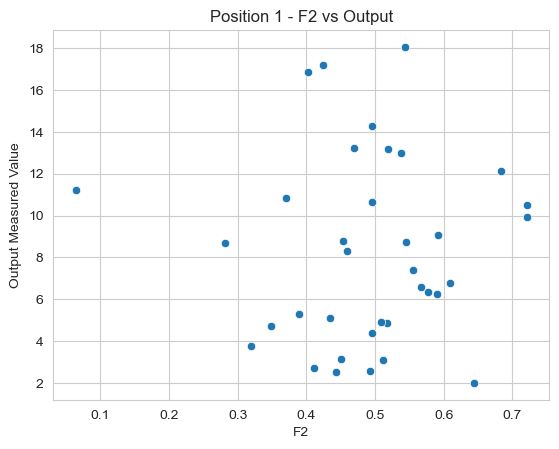

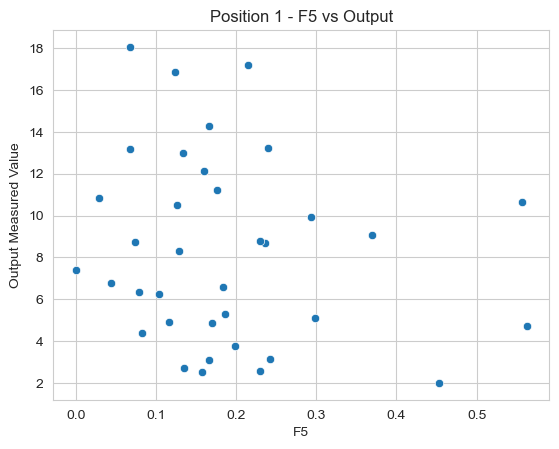

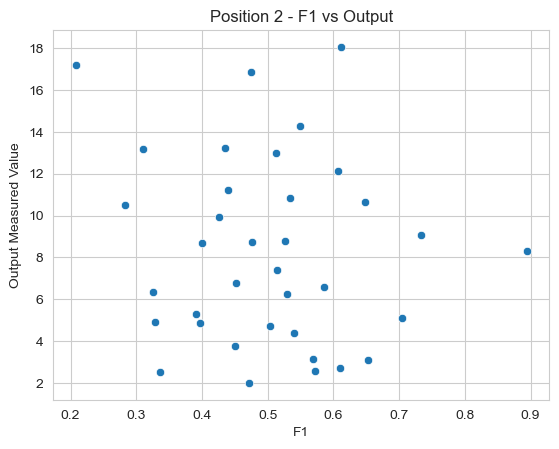

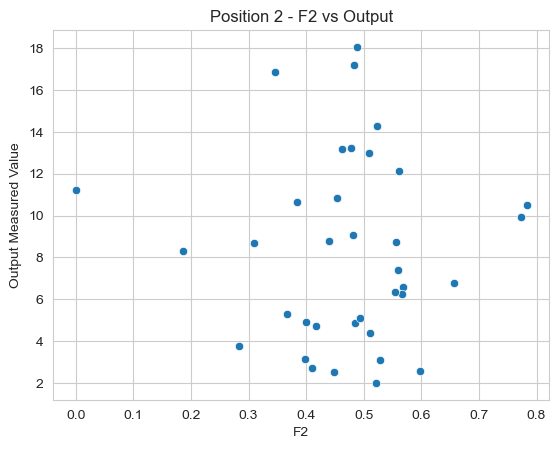

...

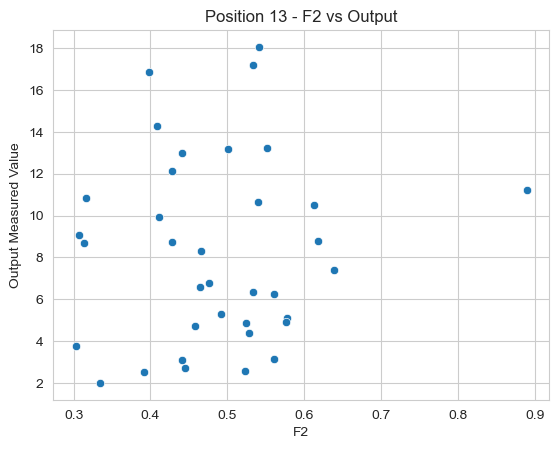

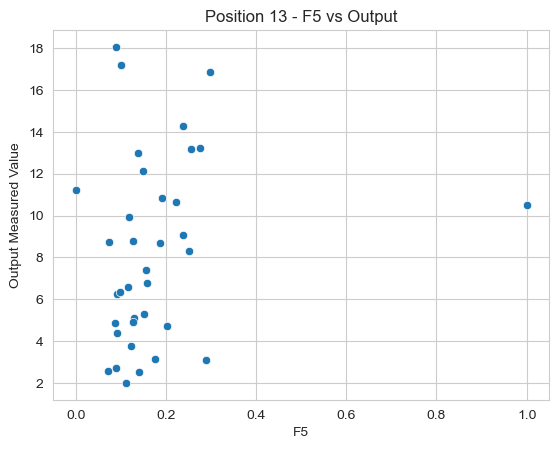

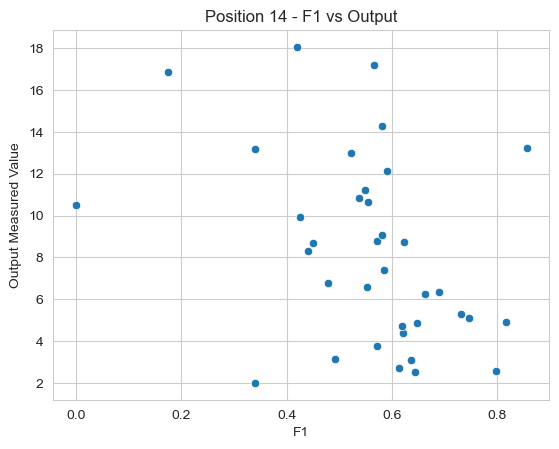

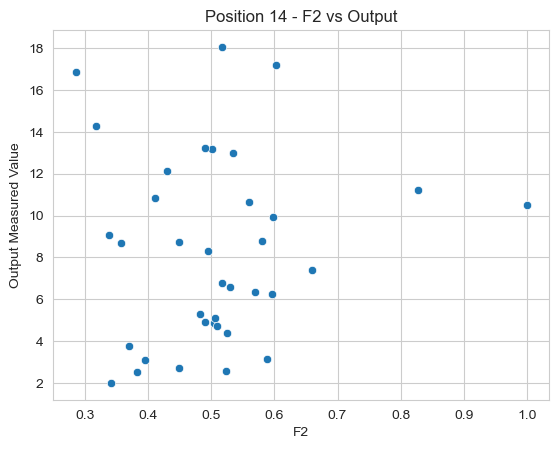

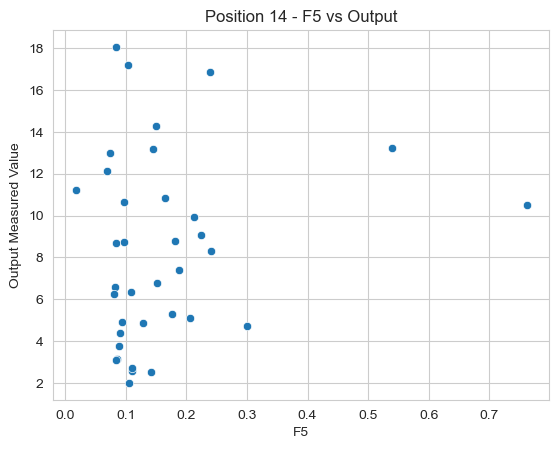

In [81]:


for pos in range(1, 15):
    for feature in ['F1', 'F2', 'F5']:
        sns.scatterplot(x=df1_combined[df1_combined['Position'] == pos][feature], 
                        y=df1_combined[df1_combined['Position'] == pos]['Output Measured Value'])
        plt.title(f"Position {pos} - {feature} vs Output")
        plt.xlabel(feature)
        plt.ylabel('Output Measured Value')
        plt.show()


    F1_mean    F1_std  F1_median   F2_mean    F2_std  F2_median   F5_mean  \
0  0.653233  0.201728   0.664442  0.424461  0.198088   0.461949  0.352472   
1  0.501545  0.128342   0.477610  0.349844  0.047974   0.347410  0.223586   
2  0.547795  0.071259   0.550910  0.398033  0.072087   0.389385  0.167902   
3  0.614479  0.128813   0.592785  0.494867  0.083533   0.489546  0.166677   
4  0.656064  0.231415   0.695125  0.497366  0.043364   0.503581  0.169405   

     F5_std  F5_median  
0  0.242571   0.253831  
1  0.097575   0.207489  
2  0.079307   0.168852  
3  0.058174   0.145625  
4  0.075999   0.146599  


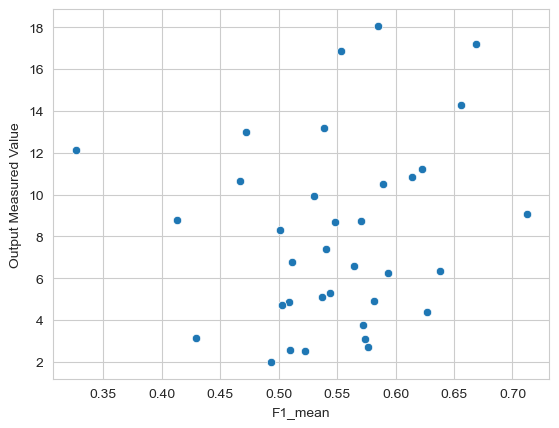

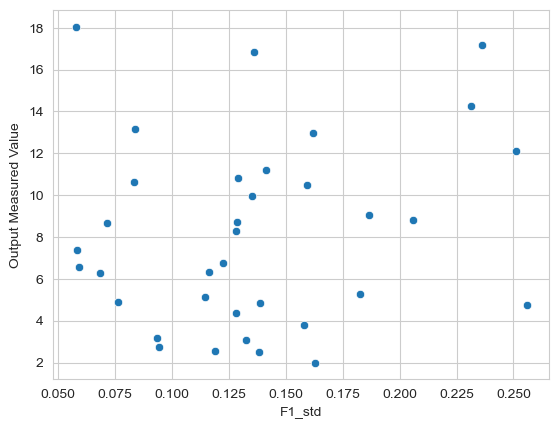

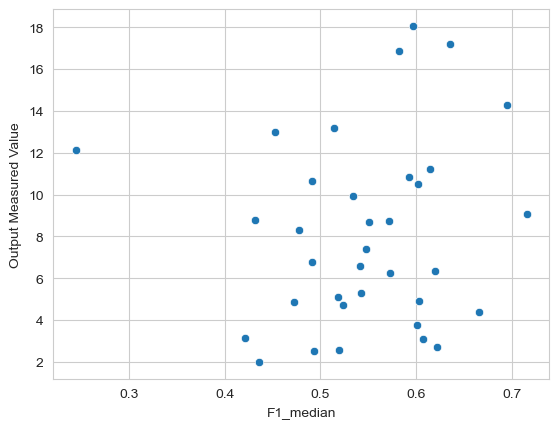

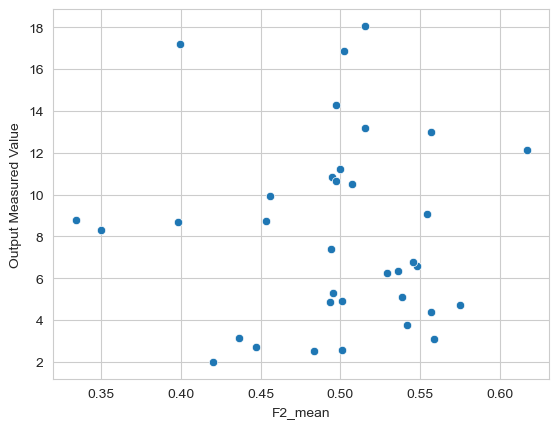

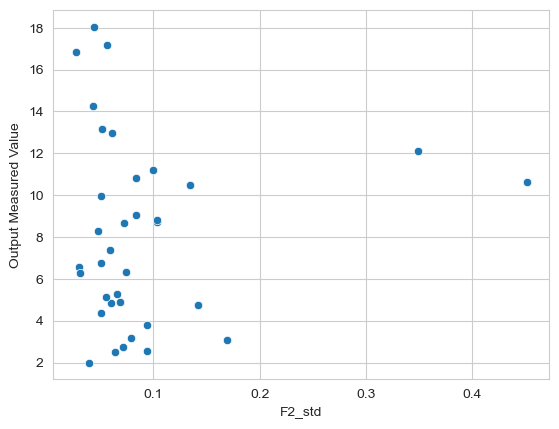

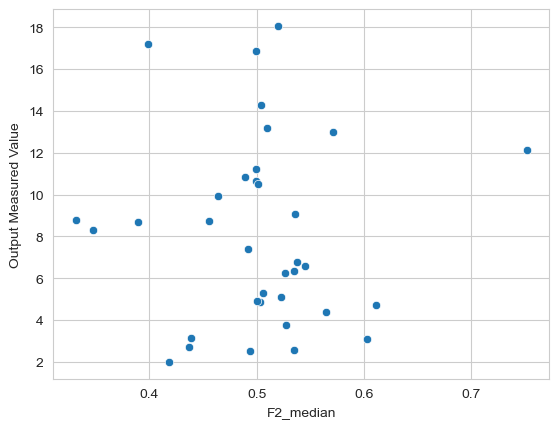

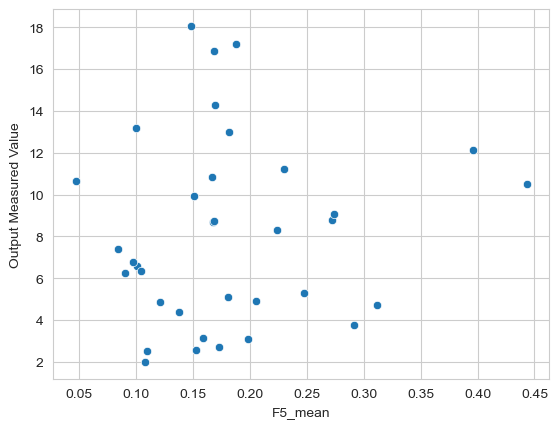

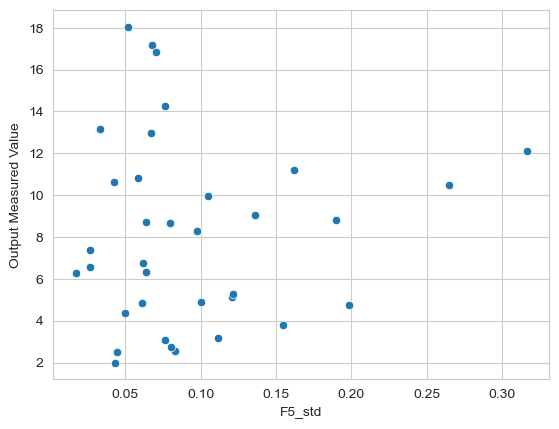

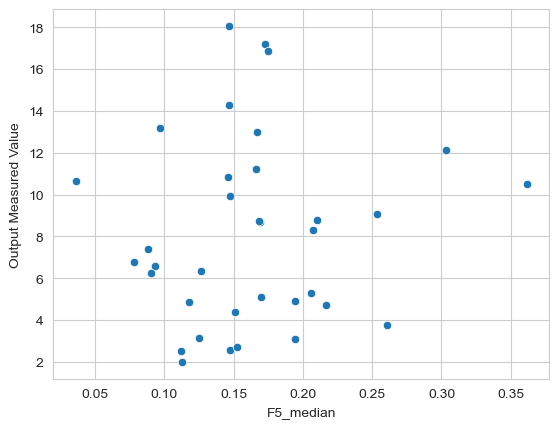

In [82]:
# Selecting only feature columns for aggregation
feature_columns = ['F1', 'F2', 'F5']  # Include other relevant features and interaction terms if present
aggregated_features = df1_combined.groupby('ID')[feature_columns].agg(['mean', 'std', 'median']).reset_index()

# Flattening the column names after aggregation
aggregated_features.columns = ['_'.join(col).strip() for col in aggregated_features.columns.values]

# Dropping the 'ID_' column if it's created after aggregation
aggregated_features.drop(columns=['ID_'], inplace=True, errors='ignore')

# Displaying the first few rows of the aggregated DataFrame
print(aggregated_features.head())


# Calculate correlations with the output
output_correlation = aggregated_features.corrwith(df1_combined.groupby('ID')['Output Measured Value'].first())

# Visualizing each aggregated feature against the output
for feature in aggregated_features.columns:
    if 'mean' in feature or 'std' in feature or 'median' in feature:  # Example condition to filter aggregated features
        sns.scatterplot(x=aggregated_features[feature], y=df1_combined.groupby('ID')['Output Measured Value'].first())
        plt.xlabel(feature)
        plt.ylabel('Output Measured Value')
        plt.show()


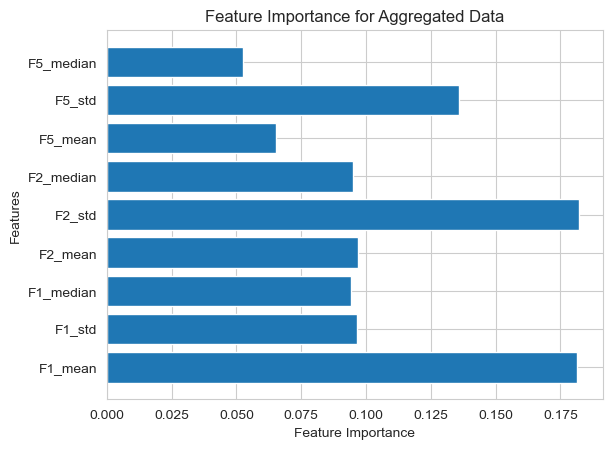

In [83]:


# Prepare the target variable - Output Measured Value for each building
y_agg = df1_combined.groupby('ID')['Output Measured Value'].first()

# Splitting the data
X_train_agg, X_test_agg, y_train_agg, y_test_agg = train_test_split(aggregated_features, y_agg, test_size=0.2, random_state=42)

# Train a model on the aggregated data
model_agg = RandomForestRegressor(random_state=42)
model_agg.fit(X_train_agg, y_train_agg)

# Getting feature importance
feature_importance_agg = model_agg.feature_importances_

# Optionally, you can visualize the feature importances

plt.barh(aggregated_features.columns, feature_importance_agg)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance for Aggregated Data')
plt.show()


In [112]:
# Assuming 'aggregated_features' is your DataFrame with aggregated features
#X = aggregated_features[['F1_mean', 'F2_std', 'F5_std']]
X = aggregated_features
y = df1_combined.groupby('ID')['Output Measured Value'].first()

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Initialize the Linear Regression model
model = LinearRegression()
# Training the model
model.fit(X_train, y_train)


# Predicting on the test set
y_pred = model.predict(X_test)

# Calculating RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'RMSE: {rmse}')

RMSE: 3.6061088503398366


In [117]:
aggregated_features

,F1_mean,F1_std,F1_median,F2_mean,F2_std,F2_median,F5_mean,F5_std,F5_median
0,0.653233,0.201728,0.664442,0.424461,0.198088,0.461949,0.352472,0.242571,0.253831
1,0.501545,0.128342,0.477610,0.349844,0.047974,0.347410,0.223586,0.097575,0.207489
2,0.547795,0.071259,0.550910,0.398033,0.072087,0.389385,0.167902,0.079307,0.168852
3,0.614479,0.128813,0.592785,0.494867,0.083533,0.489546,0.166677,0.058174,0.145625
4,0.656064,0.231415,0.695125,0.497366,0.043364,0.503581,0.169405,0.075999,0.146599
5,0.538407,0.083673,0.514445,0.515639,0.051616,0.509156,0.099971,0.032885,0.096547
6,0.472462,0.161864,0.452646,0.557015,0.061560,0.571208,0.181589,0.067143,0.166939
7,0.668714,0.236073,0.635780,0.399641,0.056136,0.398311,0.188096,0.067782,0.172435
8,0.553189,0.135944,0.581835,0.502045,0.027058,0.499579,0.168405,0.070550,0.174555
9,0.584744,0.057728,0.597038,0.515166,0.044200,0.520247,0.147869,0.051932,0.146736


In [114]:
y_test

ID
36.0    13.24
14.0     4.87
27.0     3.09
31.0    10.65
17.0     8.72
32.0    11.22
22.0     3.15
13.0     6.78
Name: Output Measured Value, dtype: float64

In [109]:
# Example: Calculating weights based on the absolute sum of correlations for each position
weights = {}
for pos in range(1, 15):
    correlations = df1_combined[df1_combined['Position'] == pos][['F1', 'F2', 'F5']].corrwith(df1_combined['Output Measured Value']).abs()
    weights[pos] = correlations.sum()

# Normalize weights so they sum up to 1
total_weight = sum(weights.values())
normalized_weights = {pos: weight / total_weight for pos, weight in weights.items()}
normalized_weights

{1: 0.04481577741479989,
 2: 0.024083082085670584,
 3: 0.020910204399041094,
 4: 0.03421353579849622,
 5: 0.04869145091027048,
 6: 0.08488570313602223,
 7: 0.09597787860852548,
 8: 0.08626824669439463,
 9: 0.1273946491503055,
 10: 0.09658174021210604,
 11: 0.09266908693522716,
 12: 0.05213639573152253,
 13: 0.08722364787242755,
 14: 0.1041486010511907}

In [110]:
# Creating a new column for the allocated output
df1_combined['Allocated_Output'] = 0

# Looping over each building and allocating output based on weights
for building_id in df1_combined['ID'].unique():
    building_output = df1_combined[df1_combined['ID'] == building_id]['Output Measured Value'].iloc[0]
    for pos in range(1, 15):
        df1_combined.loc[(df1_combined['ID'] == building_id) & (df1_combined['Position'] == pos), 'Allocated_Output'] = building_output * normalized_weights[pos]

# Displaying the DataFrame with allocated outputs
df1_combined

,ID,Output Measured Value,Position,F1,F2,F5,Allocated_Output
0,1.0,8.30,1,0.793402,0.458754,0.128595,0.371971
1,1.0,8.30,2,0.894067,0.186308,0.479431,0.199890
2,1.0,8.30,3,1.000000,0.125957,0.795595,0.173555
3,1.0,8.30,4,0.846658,0.156456,0.712682,0.283972
4,1.0,8.30,5,0.412638,0.309618,0.748513,0.404139
...,...,...,...,...,...,...,...
499,36.0,13.24,10,1.000000,0.658038,0.079978,1.278742
500,36.0,13.24,11,0.898743,0.654855,0.143090,1.226939
501,36.0,13.24,12,0.838092,0.591505,0.211443,0.690286
502,36.0,13.24,13,0.911760,0.551938,0.276389,1.154841


In [111]:
# Preparing the feature matrix and target vector
X = df1_combined[['F1', 'F2', 'F5']]
y = df1_combined['Allocated_Output']

# Splitting the dataset into the training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Predicting and evaluating the model
y_pred = lr_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Model RMSE: {rmse}')


Model RMSE: 0.43288512628502823


In [103]:
df1_combined

,ID,Output Measured Value,Position,F1,F2,F5,Allocated_Output
0,1.0,8.30,1,0.793402,0.458754,0.128595,0.371971
1,1.0,8.30,2,0.894067,0.186308,0.479431,0.199890
2,1.0,8.30,3,1.000000,0.125957,0.795595,0.173555
3,1.0,8.30,4,0.846658,0.156456,0.712682,0.283972
4,1.0,8.30,5,0.412638,0.309618,0.748513,0.404139
...,...,...,...,...,...,...,...
499,36.0,13.24,10,1.000000,0.658038,0.079978,1.278742
500,36.0,13.24,11,0.898743,0.654855,0.143090,1.226939
501,36.0,13.24,12,0.838092,0.591505,0.211443,0.690286
502,36.0,13.24,13,0.911760,0.551938,0.276389,1.154841


In [97]:
y_pred

array([0.6753242 , 0.60694946, 0.56806227, 0.54919769, 0.53557389,
       0.54493505, 0.20681259, 0.56570627, 0.50933446, 0.87846282,
       0.80896202, 0.73875258, 0.75109573, 0.56590564, 0.40276767,
       0.44254519, 0.36397781, 0.67958429, 0.65776989, 0.64174416,
       0.37007325, 0.81099027, 0.48507003, 0.98107532, 0.73335069,
       0.67120331, 0.61216646, 0.46113054, 0.48669285, 0.68207321,
       0.70095899, 0.70171292, 0.44327244, 0.60306377, 0.31940258,
       0.68924365, 0.86257003, 0.630263  , 0.62372724, 0.5198158 ,
       0.72621345, 0.63353898, 0.71313095, 0.5956097 , 0.76390146,
       0.67276383, 0.63547584, 0.54120428, 0.3508191 , 0.76949101,
       0.64616946, 0.61254374, 0.60698527, 0.59827416, 0.65520546,
       0.66015061, 0.63279205, 0.56400955, 0.28631671, 0.65259752,
       0.84175836, 0.56416733, 0.56519818, 0.38900991, 0.33339634,
       0.70479506, 0.52236577, 0.60583369, 0.56190762, 0.55386918,
       0.49964429, 0.65142723, 0.39737104, 0.50512532, 0.53539

In [98]:
y_train

75     1.100968
442    1.429368
15     0.209041
325    0.086218
388    0.921131
         ...   
106    2.146600
270    0.249300
348    0.426524
435    0.270212
102    0.820451
Name: Allocated_Output, Length: 403, dtype: float64

In [118]:
df1_combined

,ID,Output Measured Value,Position,F1,F2,F5,Allocated_Output
0,1.0,8.30,1,0.793402,0.458754,0.128595,0.371971
1,1.0,8.30,2,0.894067,0.186308,0.479431,0.199890
2,1.0,8.30,3,1.000000,0.125957,0.795595,0.173555
3,1.0,8.30,4,0.846658,0.156456,0.712682,0.283972
4,1.0,8.30,5,0.412638,0.309618,0.748513,0.404139
...,...,...,...,...,...,...,...
499,36.0,13.24,10,1.000000,0.658038,0.079978,1.278742
500,36.0,13.24,11,0.898743,0.654855,0.143090,1.226939
501,36.0,13.24,12,0.838092,0.591505,0.211443,0.690286
502,36.0,13.24,13,0.911760,0.551938,0.276389,1.154841


In [8]:
df1_combined

NameError: name 'df1_combined' is not defined

C:\Users\v-alodeh\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\v-alodeh\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


0    317
1    187
Name: Cluster, dtype: int64


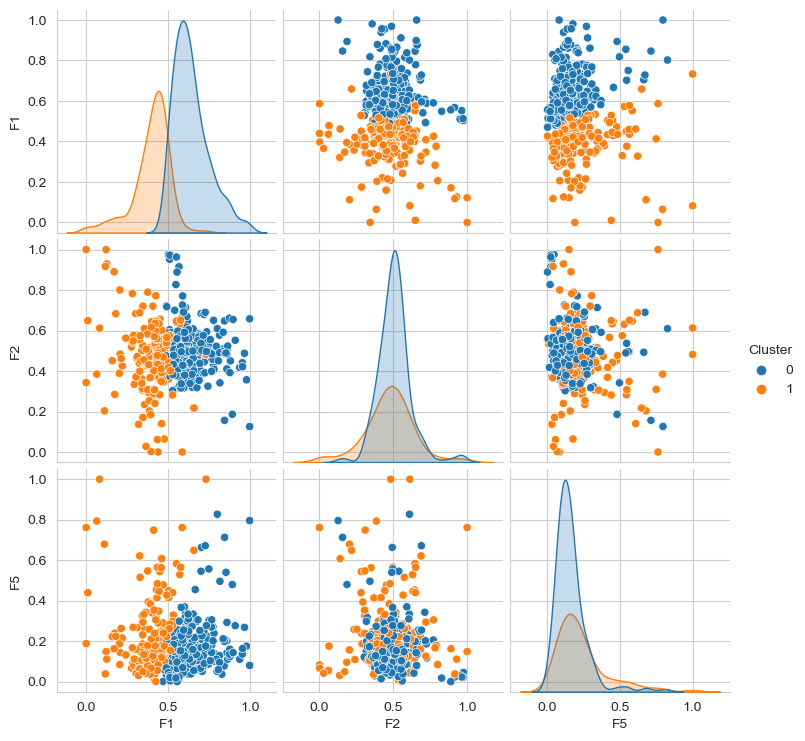

In [137]:



# Selecting features for clustering
# You might want to exclude 'ID' and 'Position' as they are identifiers, not features
# Including 'Allocated_Output' is optional and depends on whether you consider it a feature for clustering
features_for_clustering = df1_combined[['F1', 'F2', 'F5']]
# Applying K-Means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
df1_combined['Cluster'] = kmeans.fit_predict(features_for_clustering)

# Count the number of observations in each cluster
print(df1_combined['Cluster'].value_counts())

# Optionally, visualize the clusters
# Here's an example using a pairplot for the first three features
sns.pairplot(df1_combined, hue='Cluster', vars=['F1', 'F2', 'F5'])
plt.show()


In [141]:
# Preparing the data for modeling
X = df1_combined[['F1', 'F2', 'F5', 'Cluster']]  # Include 'Cluster' as a feature
y = df1_combined['Allocated_Output']  # or 'Allocated_Output' if you're still using it

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [142]:


# Training a Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predicting and evaluating the model
y_pred = model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Model RMSE: {rmse}')


Model RMSE: 0.4353915108917686


In [177]:
# Create a new DataFrame for the flattened data
flattened_df = pd.DataFrame()

# Iterate through each building
for id, group in df1_combined.groupby('ID'):
    # Initialize a dictionary for the flattened row
    flattened_row = {'ID': id, 'Output Measured Value': group['Output Measured Value'].iloc[0]}

    # Iterate through each column (excluding 'ID' and 'Output Measured Value')
    for col in [c for c in df1_combined.columns if c not in ['ID', 'Output Measured Value', 'Position']]:
        # Add each position's data to the flattened row
        for position in range(1, 15):  # Assuming there are always 7 positions
            flattened_row[f'{col} P{position}'] = group[group['Position'] == position][col].values[0]
    
    # Add the flattened row to the new DataFrame
    flattened_df = flattened_df.append(flattened_row, ignore_index=True)

C:\Users\v-alodeh\AppData\Local\Temp\ipykernel_260\599439073.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  flattened_df = flattened_df.append(flattened_row, ignore_index=True)
C:\Users\v-alodeh\AppData\Local\Temp\ipykernel_260\599439073.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  flattened_df = flattened_df.append(flattened_row, ignore_index=True)
C:\Users\v-alodeh\AppData\Local\Temp\ipykernel_260\599439073.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  flattened_df = flattened_df.append(flattened_row, ignore_index=True)
C:\Users\v-alodeh\AppData\Local\Temp\ipykernel_260\599439073.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas

In [178]:
flattened_df

,ID,Output Measured Value,F1 P1,F1 P2,F1 P3,F1 P4,F1 P5,F1 P6,F1 P7,F1 P8,...,F5 P5,F5 P6,F5 P7,F5 P8,F5 P9,F5 P10,F5 P11,F5 P12,F5 P13,F5 P14
0,1.0,8.30,0.793402,0.894067,1.000000,0.846658,0.412638,0.357420,0.433507,0.751515,...,0.748513,0.257479,0.413683,0.124061,0.119244,0.158815,0.342534,0.163248,0.250184,0.240547
1,2.0,8.68,0.413516,0.400822,0.370479,0.343052,0.379813,0.621895,0.605085,0.670547,...,0.393133,0.037615,0.317530,0.203585,0.211393,0.185442,0.193560,0.247584,0.186132,0.084248
2,3.0,10.83,0.490710,0.533898,0.462451,0.403085,0.508842,0.607635,0.704176,0.551065,...,0.230112,0.177496,0.210000,0.113238,0.089909,0.169577,0.168128,0.103898,0.191843,0.164141
3,4.0,14.26,0.605390,0.548463,0.535641,0.511731,0.432102,0.442521,0.497285,0.624161,...,0.216864,0.244507,0.103832,0.098212,0.136095,0.141034,0.118873,0.141431,0.238712,0.149820
4,5.0,13.17,0.277146,0.310052,0.475830,0.643505,0.764163,0.768902,0.653663,0.882642,...,0.179663,0.181633,0.148741,0.131804,0.110324,0.135918,0.142337,0.224774,0.256621,0.144457
5,6.0,12.97,0.499430,0.513137,0.515575,0.480100,0.460357,0.430187,0.510282,0.513316,...,0.100785,0.071723,0.077027,0.110743,0.128530,0.139098,0.145860,0.092310,0.138991,0.073490
6,7.0,17.20,0.220673,0.207938,0.363167,0.510662,0.580988,0.738933,0.775432,0.448197,...,0.120916,0.183379,0.271464,0.241568,0.151452,0.161746,0.152044,0.172132,0.099862,0.103980
7,8.0,16.85,0.419655,0.473993,0.563109,0.612697,0.628324,0.643236,0.689022,0.861115,...,0.147336,0.183629,0.169717,0.292482,0.268135,0.175152,0.163651,0.200879,0.298519,0.239012
8,9.0,18.06,0.621044,0.612164,0.611645,0.604536,0.520074,0.518778,0.486869,0.682328,...,0.178010,0.111774,0.137830,0.223804,0.302374,0.171100,0.255045,0.230962,0.088647,0.083835
9,10.0,6.57,0.563587,0.586084,0.607991,0.541466,0.516468,0.496740,0.495889,0.623127,...,0.165875,0.178770,0.180086,0.127597,0.082681,0.097625,0.117799,0.102367,0.115536,0.081913


In [169]:


# Selecting features for clustering
# You might want to exclude 'ID' and 'Position' as they are identifiers, not features
# Including 'Allocated_Output' is optional and depends on whether you consider it a feature for clustering
features_for_clustering = flattened_df[[col for col in flattened_df.columns if col not in ["ID", "Output Measured Value"]]]
# Applying K-Means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
flattened_df['Cluster'] = kmeans.fit_predict(features_for_clustering)

# Count the number of observations in each cluster
print(flattened_df['Cluster'].value_counts())

# Optionally, visualize the clusters
# Here's an example using a pairplot for the first three features
flattened_df

C:\Users\v-alodeh\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\v-alodeh\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


1    29
0     7
Name: Cluster, dtype: int64


,ID,Output Measured Value,F1 P1,F1 P2,F1 P3,F1 P4,F1 P5,F1 P6,F1 P7,F1 P8,...,F5 P6,F5 P7,F5 P8,F5 P9,F5 P10,F5 P11,F5 P12,F5 P13,F5 P14,Cluster
0,1.0,8.30,0.793402,0.894067,1.000000,0.846658,0.412638,0.357420,0.433507,0.751515,...,0.257479,0.413683,0.124061,0.119244,0.158815,0.342534,0.163248,0.250184,0.240547,0
1,2.0,8.68,0.413516,0.400822,0.370479,0.343052,0.379813,0.621895,0.605085,0.670547,...,0.037615,0.317530,0.203585,0.211393,0.185442,0.193560,0.247584,0.186132,0.084248,1
2,3.0,10.83,0.490710,0.533898,0.462451,0.403085,0.508842,0.607635,0.704176,0.551065,...,0.177496,0.210000,0.113238,0.089909,0.169577,0.168128,0.103898,0.191843,0.164141,1
3,4.0,14.26,0.605390,0.548463,0.535641,0.511731,0.432102,0.442521,0.497285,0.624161,...,0.244507,0.103832,0.098212,0.136095,0.141034,0.118873,0.141431,0.238712,0.149820,1
4,5.0,13.17,0.277146,0.310052,0.475830,0.643505,0.764163,0.768902,0.653663,0.882642,...,0.181633,0.148741,0.131804,0.110324,0.135918,0.142337,0.224774,0.256621,0.144457,1
5,6.0,12.97,0.499430,0.513137,0.515575,0.480100,0.460357,0.430187,0.510282,0.513316,...,0.071723,0.077027,0.110743,0.128530,0.139098,0.145860,0.092310,0.138991,0.073490,1
6,7.0,17.20,0.220673,0.207938,0.363167,0.510662,0.580988,0.738933,0.775432,0.448197,...,0.183379,0.271464,0.241568,0.151452,0.161746,0.152044,0.172132,0.099862,0.103980,1
7,8.0,16.85,0.419655,0.473993,0.563109,0.612697,0.628324,0.643236,0.689022,0.861115,...,0.183629,0.169717,0.292482,0.268135,0.175152,0.163651,0.200879,0.298519,0.239012,1
8,9.0,18.06,0.621044,0.612164,0.611645,0.604536,0.520074,0.518778,0.486869,0.682328,...,0.111774,0.137830,0.223804,0.302374,0.171100,0.255045,0.230962,0.088647,0.083835,1
9,10.0,6.57,0.563587,0.586084,0.607991,0.541466,0.516468,0.496740,0.495889,0.623127,...,0.178770,0.180086,0.127597,0.082681,0.097625,0.117799,0.102367,0.115536,0.081913,1


In [190]:


# Assuming flattened_df is your DataFrame
# Selecting features and output
features = flattened_df.drop(['ID', 'Output Measured Value'], axis=1)
output = flattened_df['Output Measured Value']

# Scaling features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)


# Defining the model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(scaled_features.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))  # Output layer

# Compiling the model
model.compile(optimizer='adam', loss='mean_squared_error')

X_train, X_test, y_train, y_test = train_test_split(scaled_features, output, test_size=0.2, random_state=42)
model.fit(X_train, y_train, epochs=60, batch_size=1)


Epoch 1/60
28/28 [==============================] - 1s 3ms/step - loss: 90.0791
Epoch 2/60
28/28 [==============================] - 0s 3ms/step - loss: 74.0890
Epoch 3/60
28/28 [==============================] - 0s 3ms/step - loss: 29.8137
Epoch 4/60
28/28 [==============================] - 0s 3ms/step - loss: 23.3636
Epoch 5/60
28/28 [==============================] - 0s 3ms/step - loss: 13.9024
Epoch 6/60
28/28 [==============================] - 0s 3ms/step - loss: 7.5967
Epoch 7/60
28/28 [==============================] - 0s 3ms/step - loss: 5.1345
Epoch 8/60
28/28 [==============================] - 0s 3ms/step - loss: 4.3752
Epoch 9/60
28/28 [==============================] - 0s 3ms/step - loss: 2.8286
Epoch 10/60
28/28 [==============================] - 0s 4ms/step - loss: 2.0142
Epoch 11/60
28/28 [==============================] - 0s 3ms/step - loss: 1.3505
Epoch 12/60
28/28 [==============================] - 0s 3ms/step - loss: 0.9369
Epoch 13/60
28/28 [=========================

In [191]:
y_pred = model.predict(X_test).flatten()  # Flatten to convert predictions to 1D array

1/1 [==============================] - 0s 125ms/step


In [192]:
y_pred

array([ 6.0007777,  8.85769  , 12.086292 ,  9.725294 , 10.933327 ,
        9.333169 ,  4.5245543,  9.818503 ], dtype=float32)

In [193]:
y_test

35    13.24
13     4.87
26     3.09
30    10.65
16     8.72
31    11.22
21     3.15
12     6.78
Name: Output Measured Value, dtype: float64

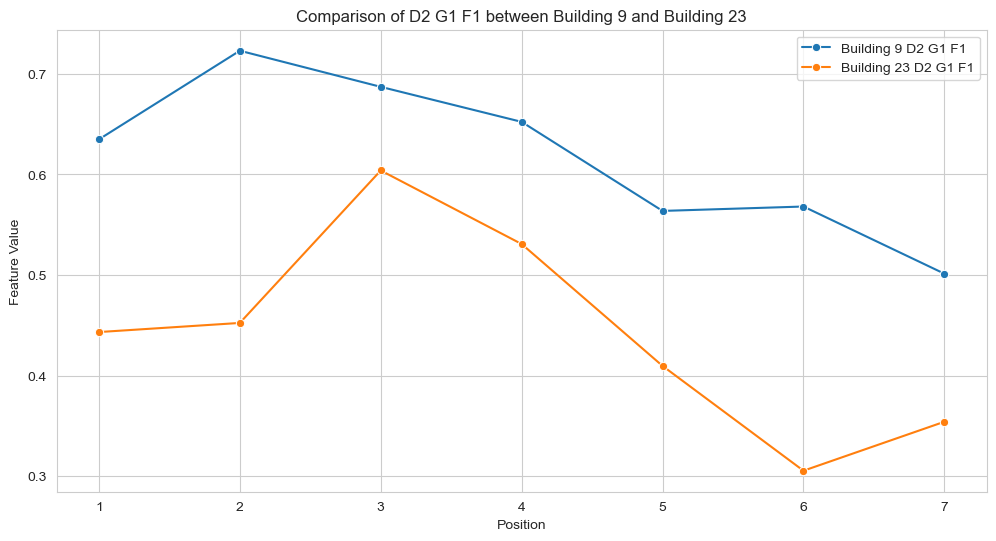

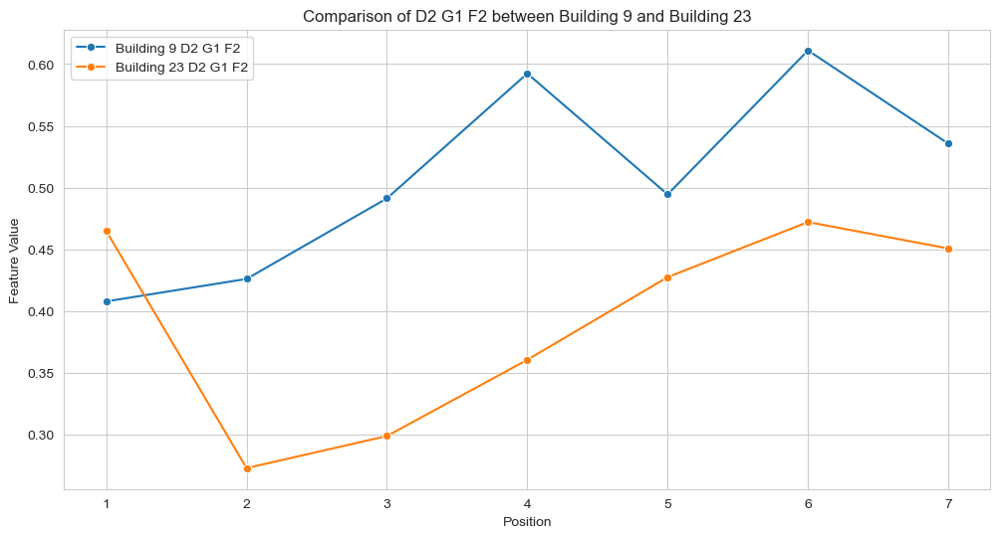

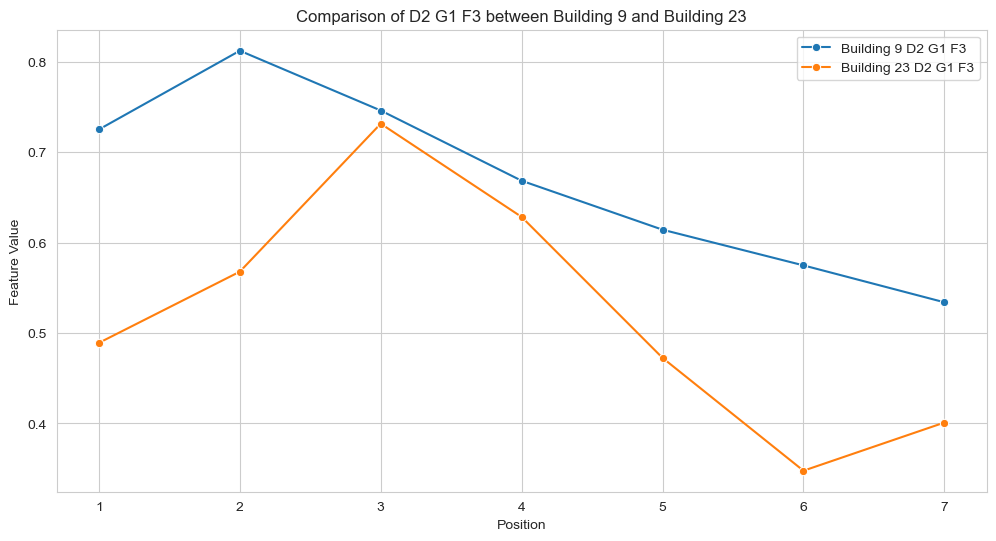

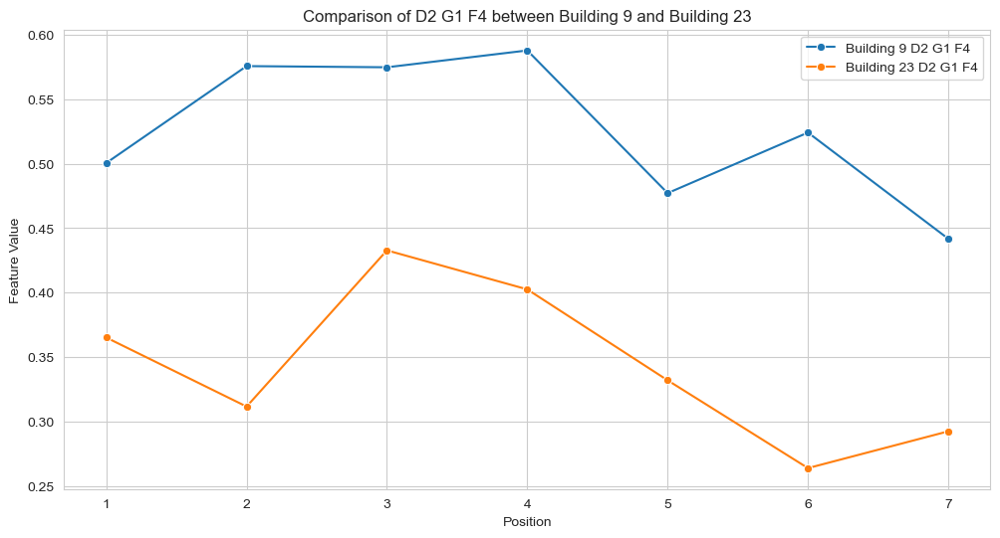

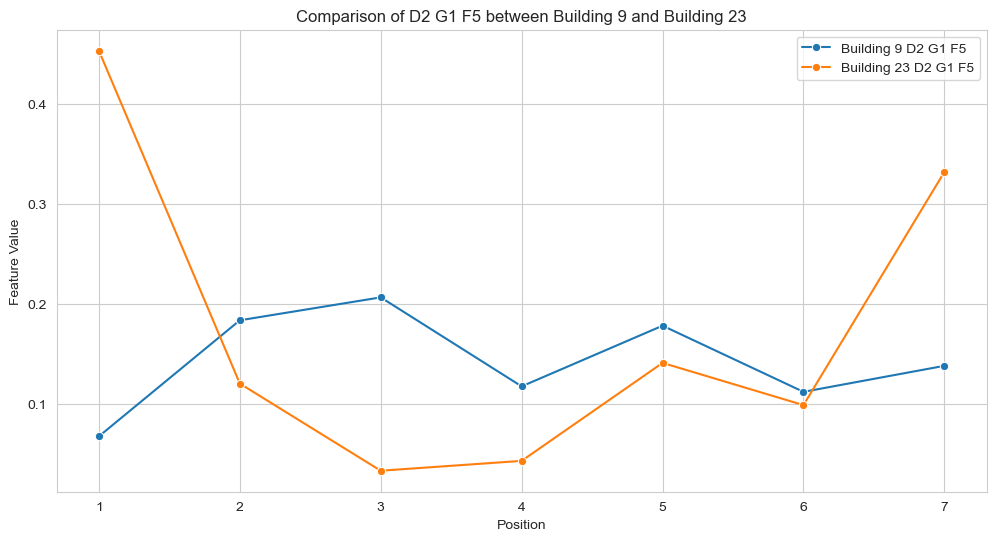

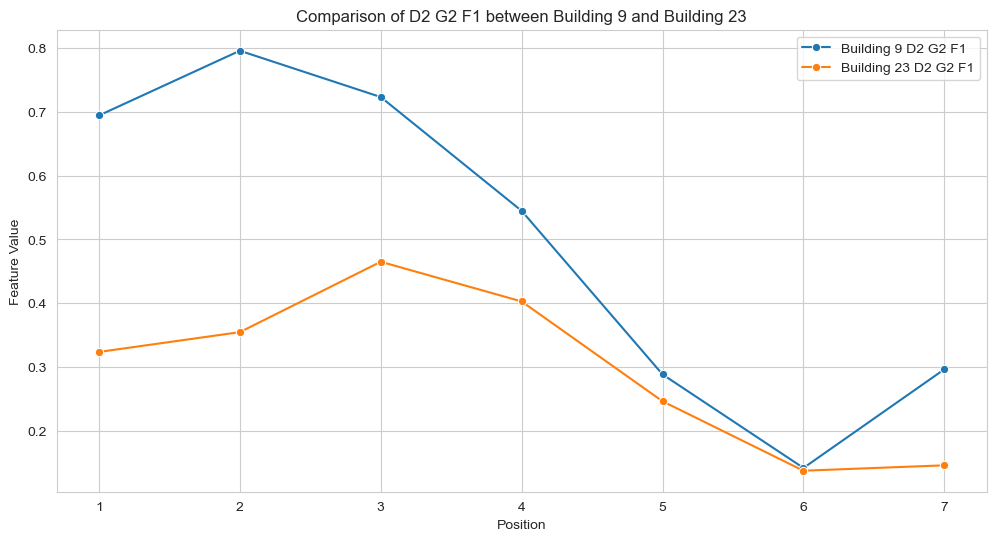

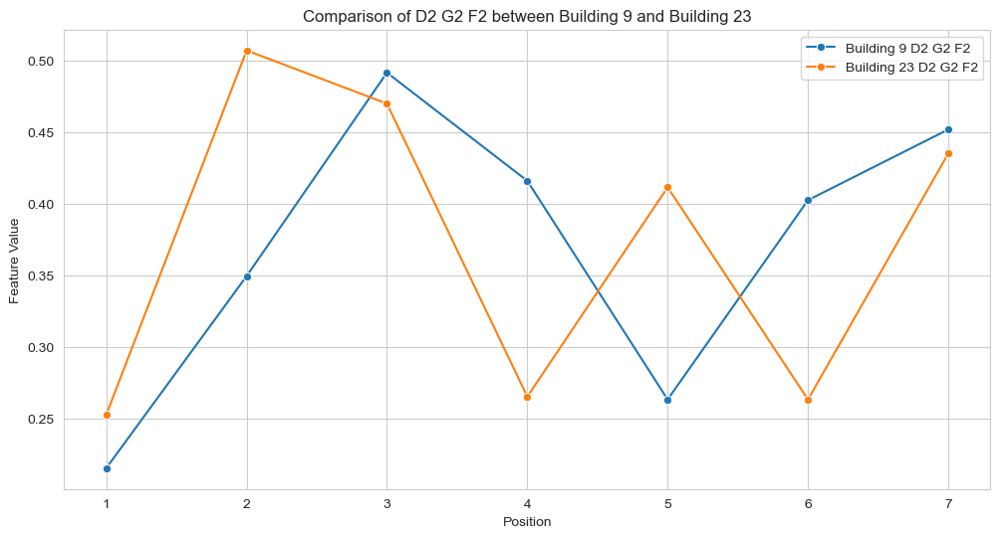

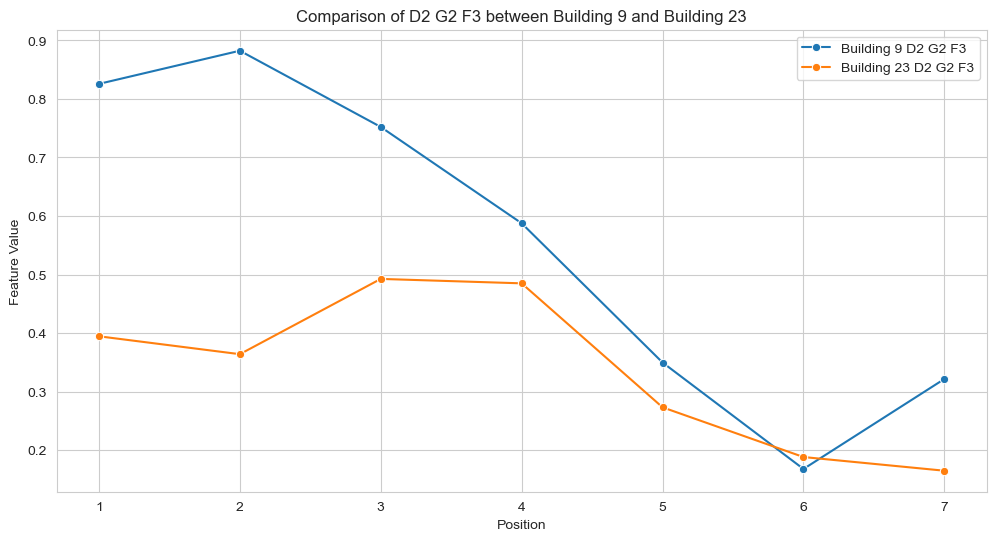

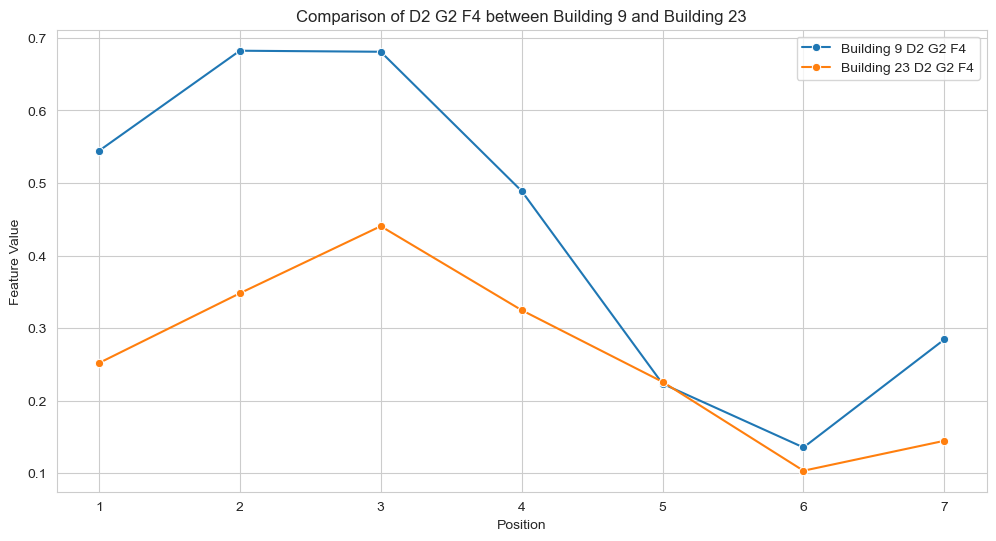

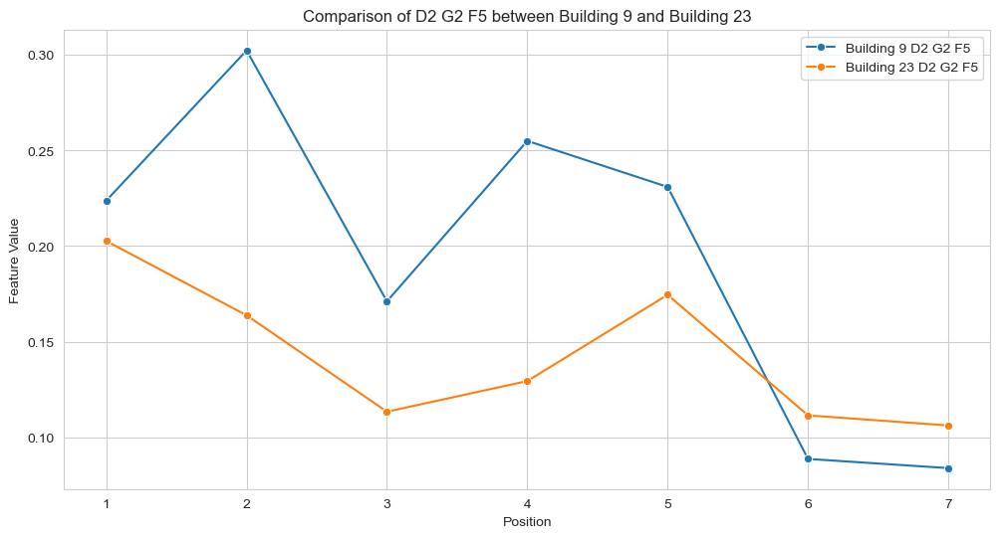

In [213]:


# List of feature columns to visualize
feature_columns = ['D2 G1 F1', 'D2 G1 F2', 'D2 G1 F3', 'D2 G1 F4', 'D2 G1 F5', 
                   'D2 G2 F1', 'D2 G2 F2', 'D2 G2 F3', 'D2 G2 F4', 'D2 G2 F5']

df_building_9 = df2[df2['ID'] == 9]
df_building_23 = df2[df2['ID'] == 23]

# Loop through each feature and create plots
for feature in feature_columns:
    plt.figure(figsize=(12, 6))

    # Plotting for building ID 9
    sns.lineplot(x='Position', y=feature, data=df_building_9, label=f'Building 9 {feature}', marker='o')

    # Plotting for building ID 23
    sns.lineplot(x='Position', y=feature, data=df_building_23, label=f'Building 23 {feature}', marker='o')

    plt.title(f'Comparison of {feature} between Building 9 and Building 23')
    plt.xlabel('Position')
    plt.ylabel('Feature Value')
    plt.legend()
    plt.show()


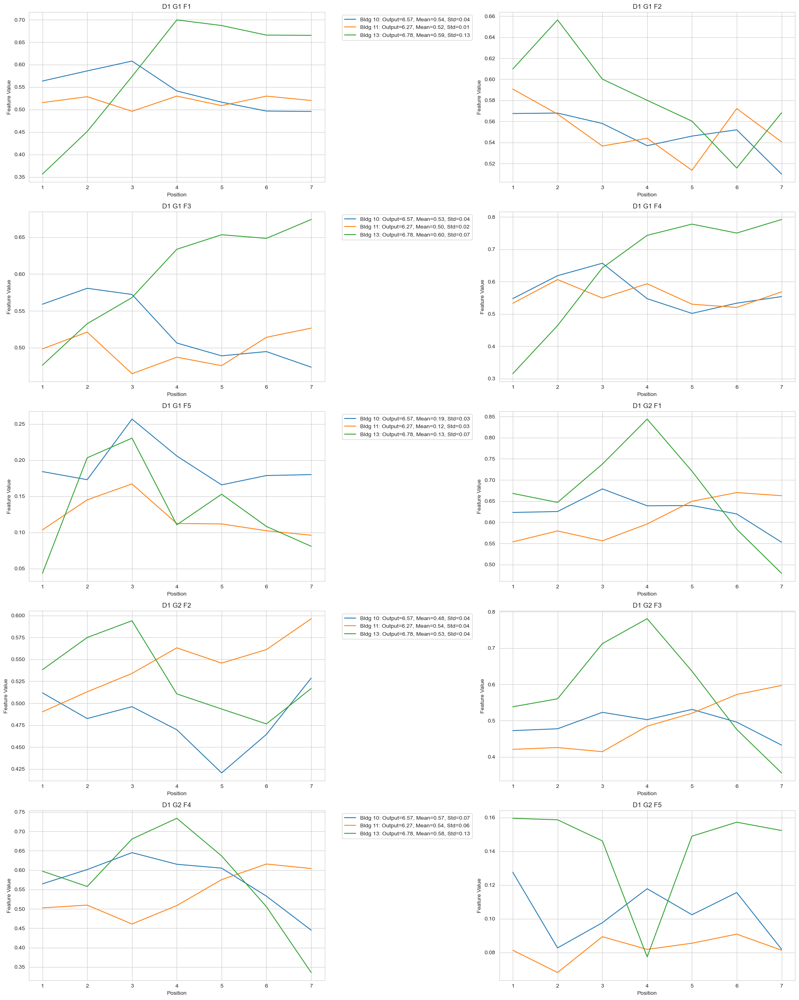

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Selected building IDs
selected_buildings = [10, 11, 13]

# List of feature columns related to 'D1 G1' and 'D1 G2'
feature_columns = ['D1 G1 F1', 'D1 G1 F2', 'D1 G1 F3', 'D1 G1 F4', 'D1 G1 F5', 
                   'D1 G2 F1', 'D1 G2 F2', 'D1 G2 F3', 'D1 G2 F4', 'D1 G2 F5']

# Number of rows for the subplot grid, 2 plots per line
n_rows = len(feature_columns) // 2 + int(len(feature_columns) % 2 != 0)

# Create a figure with subplots
plt.figure(figsize=(20, 5 * n_rows))  # Adjust the figure size as needed

# Loop through each feature and create subplots
for idx, feature in enumerate(feature_columns, 1):
    plt.subplot(n_rows, 2, idx)

    # Iterate over each selected building
    for building_id in selected_buildings:
        building_data = df1[df1['ID'] == building_id]
        output_value = building_data['Output Measured Value'].iloc[0]
        mean_val = building_data[feature].mean()
        std_val = building_data[feature].std()
        label = f'Bldg {int(building_id)}: Output={output_value:.2f}, Mean={mean_val:.2f}, Std={std_val:.2f}'

        sns.lineplot(x='Position', y=feature, data=building_data, label=label)

    plt.title(f'{feature}')
    plt.xlabel('Position')
    plt.ylabel('Feature Value')
    if idx % 2 == 1:  # Only add legend to the first plot of each line
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        plt.legend([],[], frameon=False)  # No legend for other plots

plt.tight_layout()
plt.show()


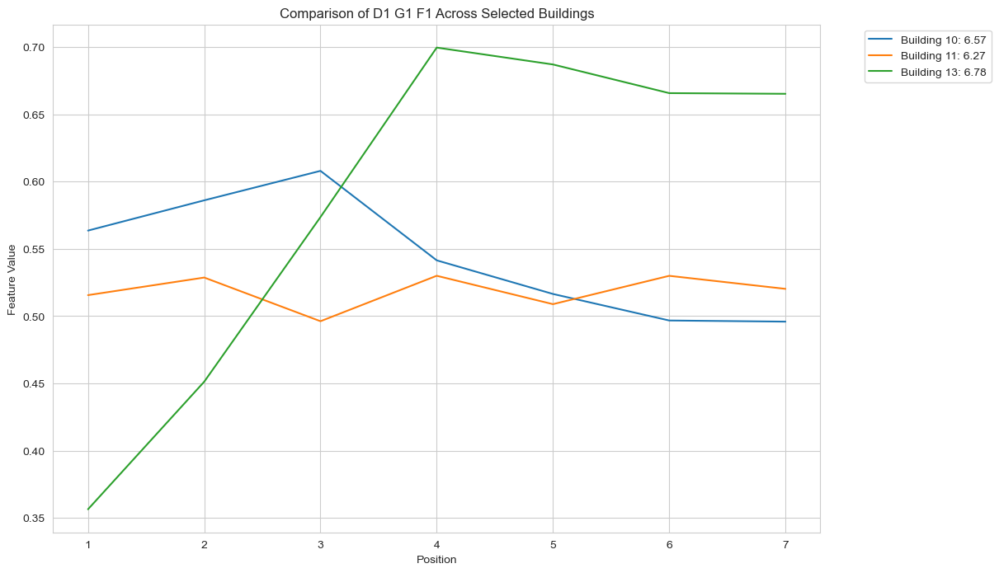

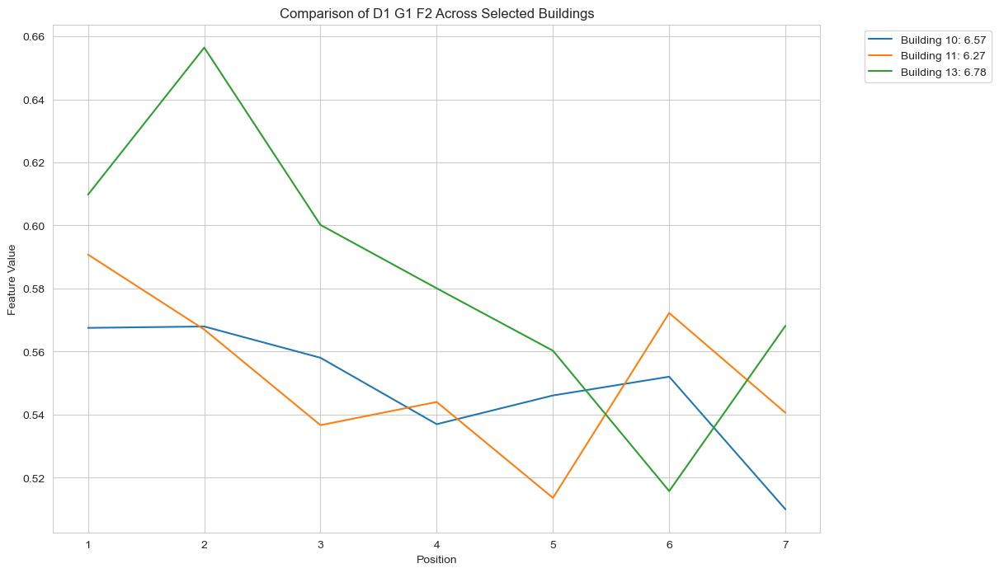

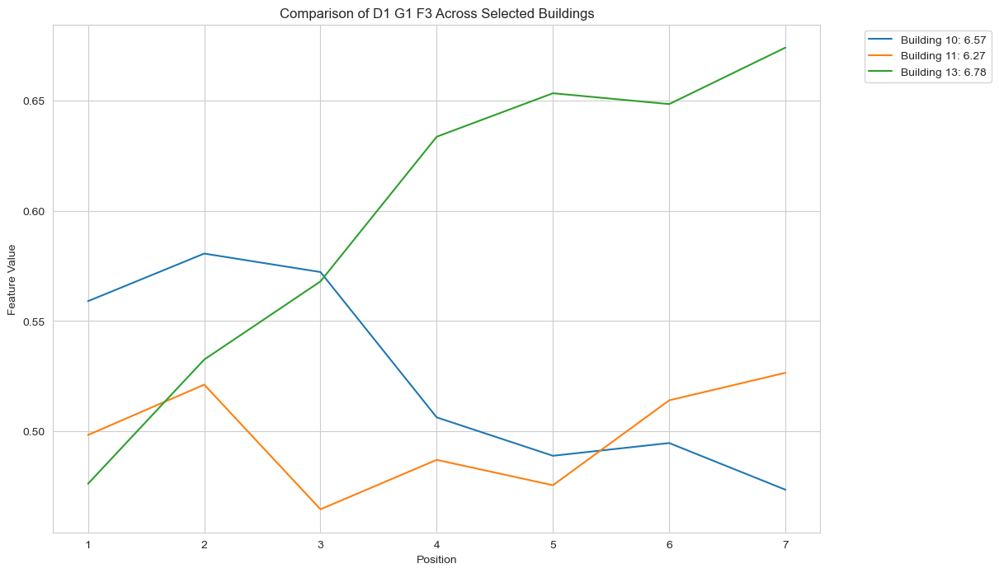

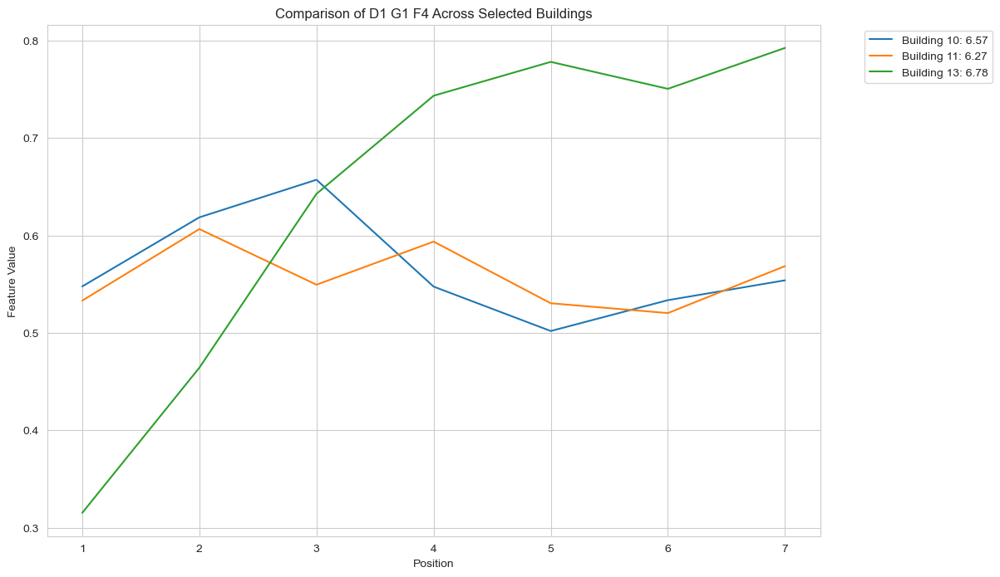

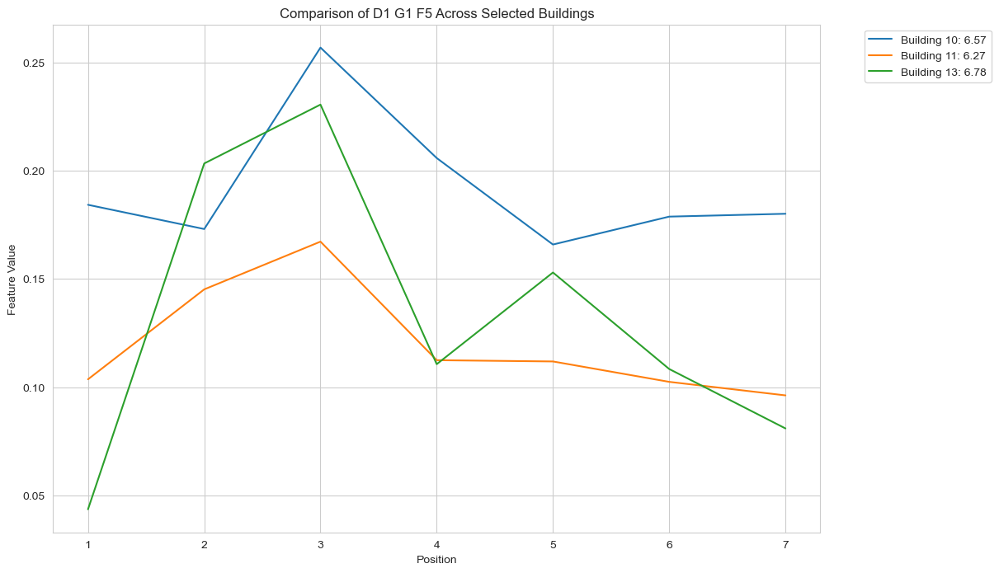

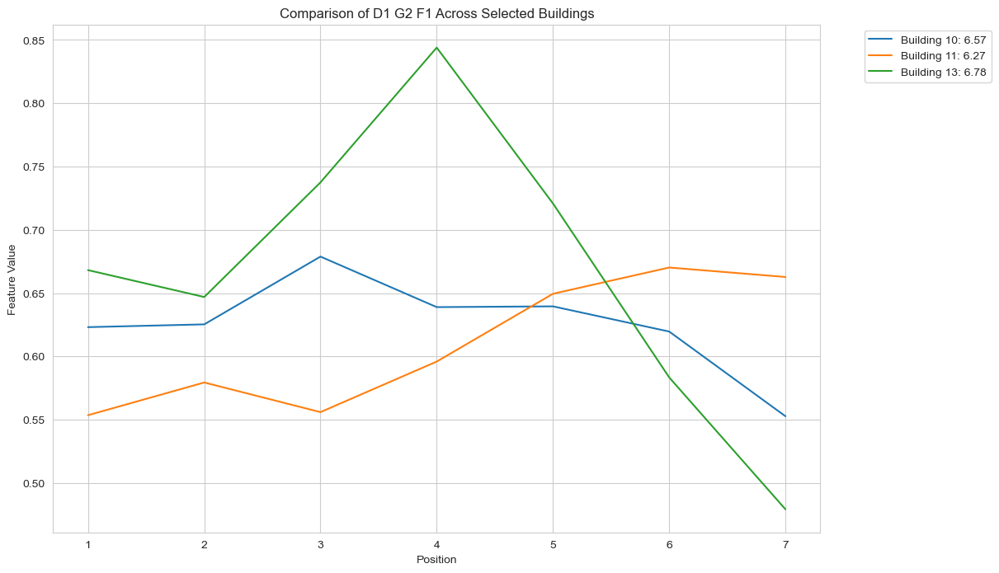

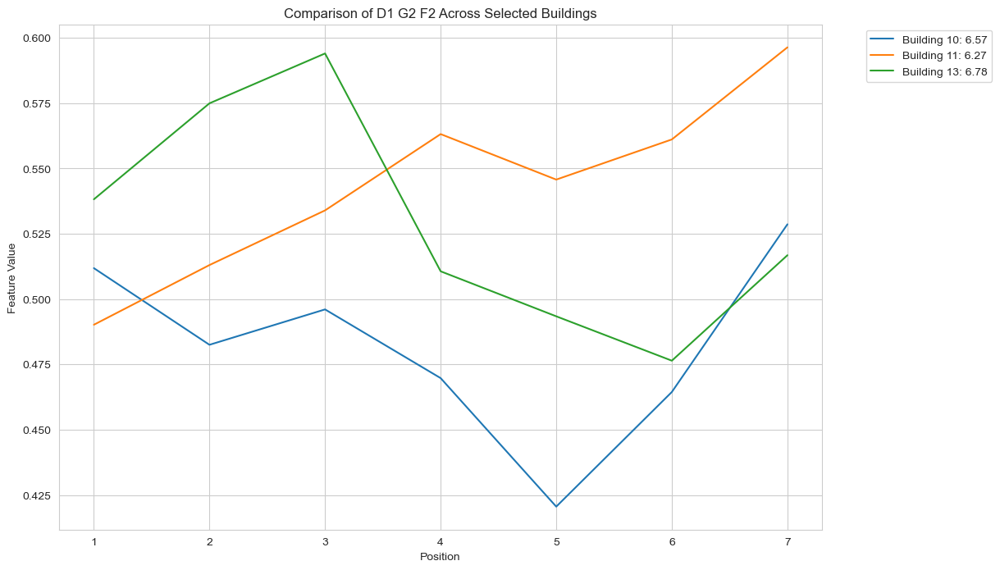

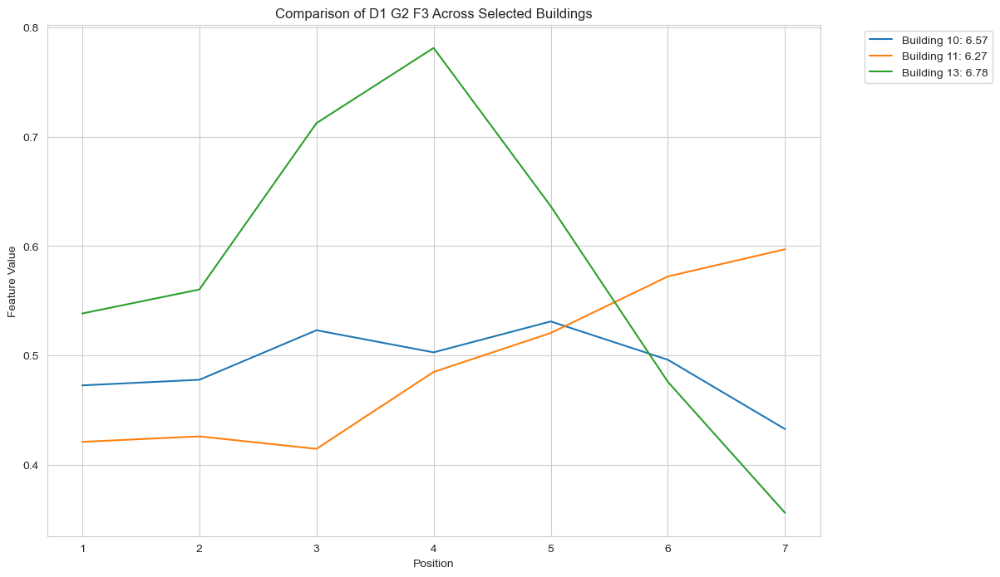

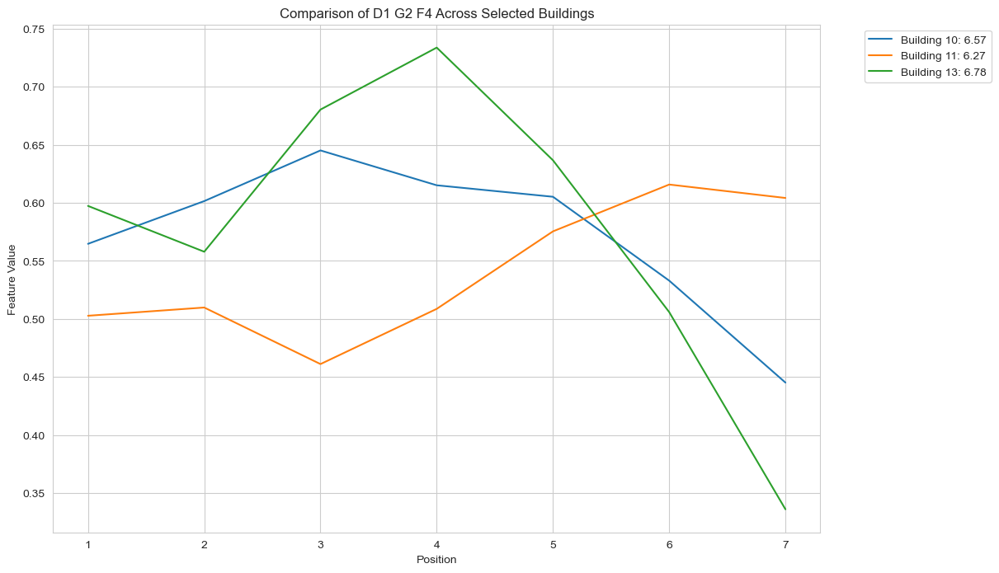

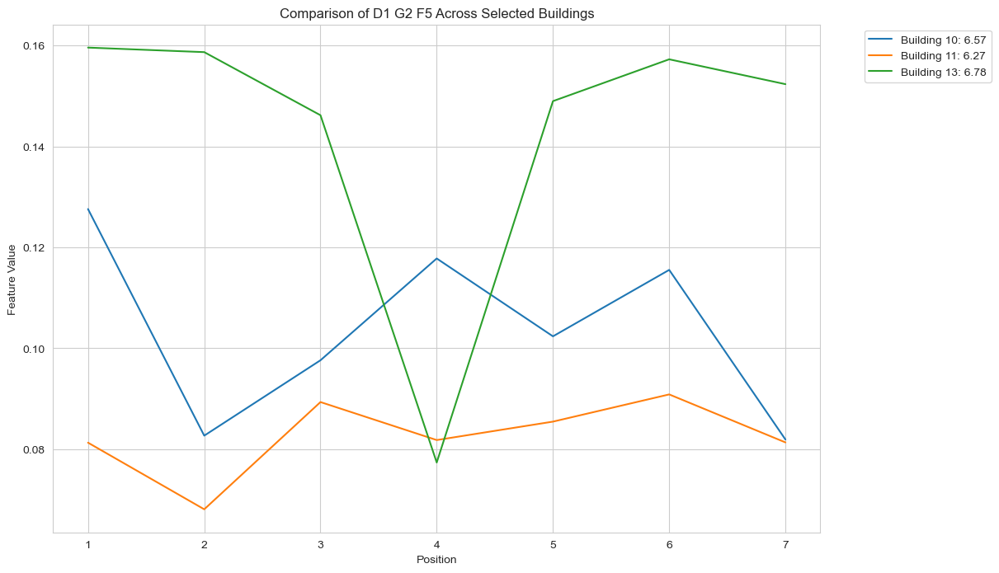

In [18]:


# Selected building IDs
selected_buildings = [10,11,13]

# List of feature columns related to 'D2 G1' and 'D2 G2'
feature_columns = ['D1 G1 F1', 'D1 G1 F2', 'D1 G1 F3', 'D1 G1 F4', 'D1 G1 F5', 
                   'D1 G2 F1', 'D1 G2 F2', 'D1 G2 F3', 'D1 G2 F4', 'D1 G2 F5']

# Loop through each feature and create plots
for feature in feature_columns:
    plt.figure(figsize=(12, 8))

    # Iterate over each selected building
    for building_id in selected_buildings:
        building_data = df1[df1['ID'] == building_id]
        output_value = building_data['Output Measured Value'].iloc[0]
        label = f'Building {int(building_id)}: {output_value:.2f}'

        sns.lineplot(x='Position', y=feature, data=building_data, label=label)

    plt.title(f'Comparison of {feature} Across Selected Buildings')
    plt.xlabel('Position')
    plt.ylabel('Feature Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


In [8]:

# Define the categorization function

# Display the updated DataFrame
print(df1.head())


,ID,Output Measured Value,Position,D1 G1 F1,D1 G1 F2,D1 G1 F3,D1 G1 F4,D1 G1 F5,D1 G2 F1,D1 G2 F2,D1 G2 F3,D1 G2 F4,D1 G2 F5
0,1.0,8.30,1,0.793402,0.458754,0.745848,0.815479,0.128595,0.751515,0.552227,0.813449,0.624779,0.124061
1,1.0,8.30,2,0.894067,0.186308,0.888459,0.952466,0.479431,0.779498,0.650727,0.954253,0.706926,0.119244
2,1.0,8.30,3,1.000000,0.125957,1.000000,0.893270,0.795595,0.703294,0.684120,0.885336,0.622157,0.158815
3,1.0,8.30,4,0.846658,0.156456,0.800913,0.692508,0.712682,0.608386,0.713376,0.591816,0.644515,0.342534
4,1.0,8.30,5,0.412638,0.309618,0.561062,0.614874,0.748513,0.625590,0.542055,0.421188,0.799299,0.163248
...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,36.0,13.24,3,0.493638,0.566368,0.552243,0.500628,0.427444,1.000000,0.658038,1.000000,1.000000,0.079978
248,36.0,13.24,4,0.578332,0.520293,0.608496,0.611169,0.152635,0.898743,0.654855,0.831702,0.871683,0.143090
249,36.0,13.24,5,0.735558,0.496447,0.687698,0.784252,0.276801,0.838092,0.591505,0.667525,0.872440,0.211443
250,36.0,13.24,6,0.695751,0.437844,0.654336,0.716743,0.252937,0.911760,0.551938,0.718889,0.978073,0.276389


In [10]:
df1

,ID,Output Measured Value,Position,D1 G1 F1,D1 G1 F2,D1 G1 F3,D1 G1 F4,D1 G1 F5,D1 G2 F1,D1 G2 F2,D1 G2 F3,D1 G2 F4,D1 G2 F5,Strength Category
0,1.0,8.30,1,0.793402,0.458754,0.745848,0.815479,0.128595,0.751515,0.552227,0.813449,0.624779,0.124061,Moderate
1,1.0,8.30,2,0.894067,0.186308,0.888459,0.952466,0.479431,0.779498,0.650727,0.954253,0.706926,0.119244,Moderate
2,1.0,8.30,3,1.000000,0.125957,1.000000,0.893270,0.795595,0.703294,0.684120,0.885336,0.622157,0.158815,Moderate
3,1.0,8.30,4,0.846658,0.156456,0.800913,0.692508,0.712682,0.608386,0.713376,0.591816,0.644515,0.342534,Moderate
4,1.0,8.30,5,0.412638,0.309618,0.561062,0.614874,0.748513,0.625590,0.542055,0.421188,0.799299,0.163248,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,36.0,13.24,3,0.493638,0.566368,0.552243,0.500628,0.427444,1.000000,0.658038,1.000000,1.000000,0.079978,High
248,36.0,13.24,4,0.578332,0.520293,0.608496,0.611169,0.152635,0.898743,0.654855,0.831702,0.871683,0.143090,High
249,36.0,13.24,5,0.735558,0.496447,0.687698,0.784252,0.276801,0.838092,0.591505,0.667525,0.872440,0.211443,High
250,36.0,13.24,6,0.695751,0.437844,0.654336,0.716743,0.252937,0.911760,0.551938,0.718889,0.978073,0.276389,High


In [40]:
df1

,ID,Output Measured Value,Strength,Position,D1 G1 F1,D1 G1 F2,D1 G1 F3,D1 G1 F4,D1 G1 F5,D1 G2 F1,D1 G2 F2,D1 G2 F3,D1 G2 F4,D1 G2 F5
0,1.0,8.30,Moderate,1,0.793402,0.458754,0.745848,0.815479,0.128595,0.751515,0.552227,0.813449,0.624779,0.124061
1,1.0,8.30,Moderate,2,0.894067,0.186308,0.888459,0.952466,0.479431,0.779498,0.650727,0.954253,0.706926,0.119244
2,1.0,8.30,Moderate,3,1.000000,0.125957,1.000000,0.893270,0.795595,0.703294,0.684120,0.885336,0.622157,0.158815
3,1.0,8.30,Moderate,4,0.846658,0.156456,0.800913,0.692508,0.712682,0.608386,0.713376,0.591816,0.644515,0.342534
4,1.0,8.30,Moderate,5,0.412638,0.309618,0.561062,0.614874,0.748513,0.625590,0.542055,0.421188,0.799299,0.163248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,36.0,13.24,High,3,0.493638,0.566368,0.552243,0.500628,0.427444,1.000000,0.658038,1.000000,1.000000,0.079978
248,36.0,13.24,High,4,0.578332,0.520293,0.608496,0.611169,0.152635,0.898743,0.654855,0.831702,0.871683,0.143090
249,36.0,13.24,High,5,0.735558,0.496447,0.687698,0.784252,0.276801,0.838092,0.591505,0.667525,0.872440,0.211443
250,36.0,13.24,High,6,0.695751,0.437844,0.654336,0.716743,0.252937,0.911760,0.551938,0.718889,0.978073,0.276389
